# Analysis of sampled solution spaces

In [1]:
# import the pkl file top_batch1_sampled_fluxes_timepoint0.pkl and read the samples
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import cobra
from cobra.io import load_model, read_sbml_model
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

import re
from matplotlib.colors import LogNorm
from typing import List, Optional, Dict, Tuple, Any

In [2]:
with open('top_batch1_sampled_fluxes_timepoint_0.pkl', 'rb') as f:
    samples = pickle.load(f)
# print the shape of the samples
print(samples.shape)


(5000, 6337)


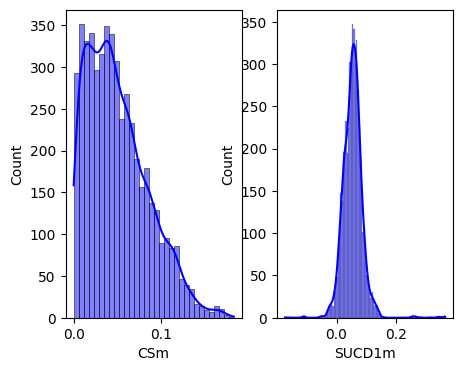

In [3]:
TCA_rxns = ['CSm', 'SUCD1m' ]

fig, axes = plt.subplots(1, 2, figsize=(5, 4))
for i, var in enumerate(TCA_rxns):
    sns.histplot(data=samples[var], kde=True, ax= axes[i], color='blue', label='Exponential growth')

Explained variation per principal component: [0.29056977 0.17673895 0.10968081]


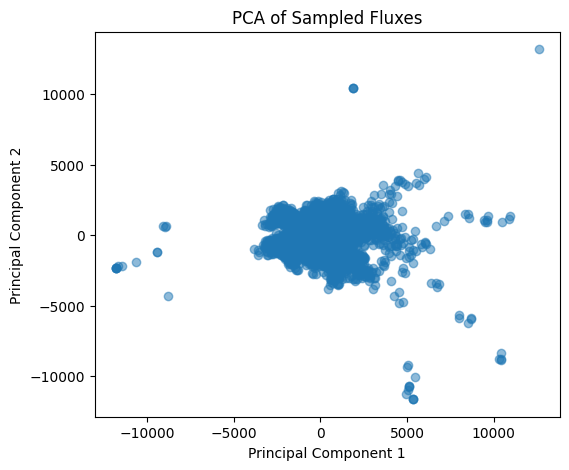

In [7]:
# PCA to find the principal components of the sampled fluxes
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(samples)
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))
# plot the first two principal components
plt.figure(figsize=(6, 5))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of Sampled Fluxes')
plt.show()

In [8]:
# find number of components that explain 95% of the variance
pca = PCA(n_components=64)
pca_result = pca.fit_transform(samples)
print('Explained variation per principal component: {} and total variance explained is {}'.format(pca.explained_variance_ratio_, sum(pca.explained_variance_ratio_)))

Explained variation per principal component: [0.29056977 0.17673895 0.10968081 0.08010581 0.03757026 0.0279388
 0.02662907 0.02489584 0.02388446 0.01912268 0.01798482 0.01551275
 0.01374987 0.01212478 0.00978344 0.00860798 0.00722032 0.00699317
 0.0067306  0.00556004 0.00490707 0.0048158  0.00419328 0.00366787
 0.0035938  0.00342166 0.00326295 0.00295775 0.00270474 0.00252381
 0.00218144 0.00214081 0.00177692 0.00164262 0.0016017  0.00152604
 0.00132523 0.00122825 0.00119703 0.00113282 0.00107498 0.00104068
 0.00093764 0.00091288 0.00090405 0.00085083 0.000815   0.00077899
 0.00071273 0.00070645 0.00066642 0.00063253 0.00058385 0.00054746
 0.00053866 0.0005058  0.00049297 0.00046866 0.00044337 0.00043019
 0.00041743 0.00041518 0.00037297 0.00036197] and total variance explained is 0.988817502946331


In [4]:
raw_model = 'iCHO2441.xml'
model = read_sbml_model(raw_model)

In [5]:
r1 = model.reactions.get_by_id('CSm')
r2 = model.reactions.get_by_id('SUCD1m')
print('subsystem is ',r1.subsystem)

subsystem is  


In [6]:
old_model = 'iCHOv1_DG44_final.xml'
old_model = read_sbml_model(old_model)
r1_1 = old_model.reactions.get_by_id('CSm')


In [7]:

print('subsystem in old model is ',r1_1.subsystem)

subsystem in old model is  CITRIC ACID CYCLE


In [8]:
#find how many reactions in model and old_model are common
model_reactions = set([rxn.id for rxn in model.reactions])
old_model_reactions = set([rxn.id for rxn in old_model.reactions])
common_reactions = model_reactions.intersection(old_model_reactions)
print('Number of common reactions between model and old model is ', len(common_reactions))

Number of common reactions between model and old model is  2098


In [9]:
# for all these common reactions, set the subsystem in model to be same as in old_model
for rxn_id in common_reactions:
    rxn_model = model.reactions.get_by_id(rxn_id)
    rxn_old_model = old_model.reactions.get_by_id(rxn_id)
    rxn_model.subsystem = rxn_old_model.subsystem


In [10]:
r1 = model.reactions.get_by_id('CSm')
r2 = model.reactions.get_by_id('SUCD1m')
print('subsystem is ',r2.subsystem)

subsystem is  CITRIC ACID CYCLE


In [11]:
tmp = {}
for i in model.reactions:
    if i.subsystem != "":
        if i.subsystem not in tmp.keys():
            tmp[i.subsystem] = 1
        else:
            tmp[i.subsystem] += 1
tmp

{'TRANSPORT, LYSOSOMAL': 44,
 'TRANSPORT, MITOCHONDRIAL': 152,
 'TRANSPORT, ENDOPLASMIC RETICULAR': 76,
 'TRANSPORT, EXTRACELLULAR': 348,
 'LYSINE METABOLISM': 6,
 'METHIONINE AND CYSTEINE METABOLISM': 17,
 'EXCHANGE': 144,
 'PYRIMIDINE CATABOLISM': 17,
 'PROPANOATE METABOLISM': 5,
 'TRYPTOPHAN METABOLISM': 18,
 'TYROSINE METABOLISM': 18,
 'UBIQUINONE SYNTHESIS': 10,
 'TRANSPORT, NUCLEAR': 46,
 'SPHINGOLIPID METABOLISM': 7,
 'TAURINE AND HYPOTAURINE METABOLISM': 2,
 'ARGININE AND PROLINE METABOLISM': 22,
 'STEROID METABOLISM': 36,
 'HEME SYNTHESIS': 9,
 'N-GLYCAN DEGRADATION': 10,
 'O-GLYCAN SYNTHESIS': 14,
 'PENTOSE PHOSPHATE PATHWAY': 26,
 'BETA-ALANINE METABOLISM': 5,
 'VALINE, LEUCINE, AND ISOLEUCINE METABOLISM': 17,
 'CHOLESTEROL METABOLISM': 34,
 'TRANSPORT, PEROXISOMAL': 61,
 'FATTY ACID METABOLISM': 1,
 'AMINOSUGAR METABOLISM': 18,
 'CITRIC ACID CYCLE': 10,
 'BUTANOATE METABOLISM': 1,
 'VITAMIN B2 METABOLISM': 2,
 'PYRUVATE METABOLISM': 23,
 'PURINE CATABOLISM': 13,
 'NUCLEOTID

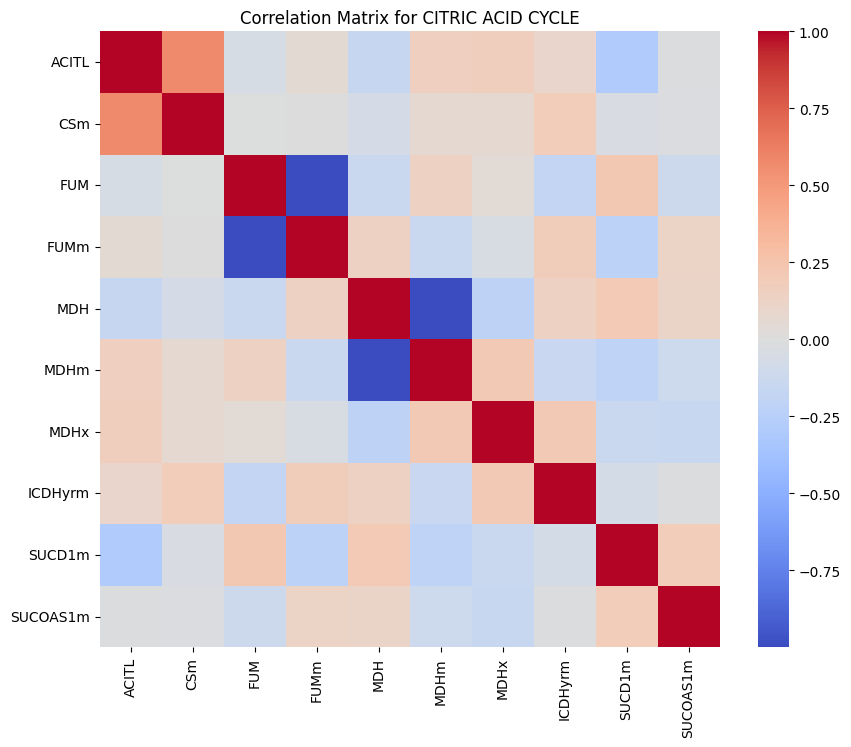

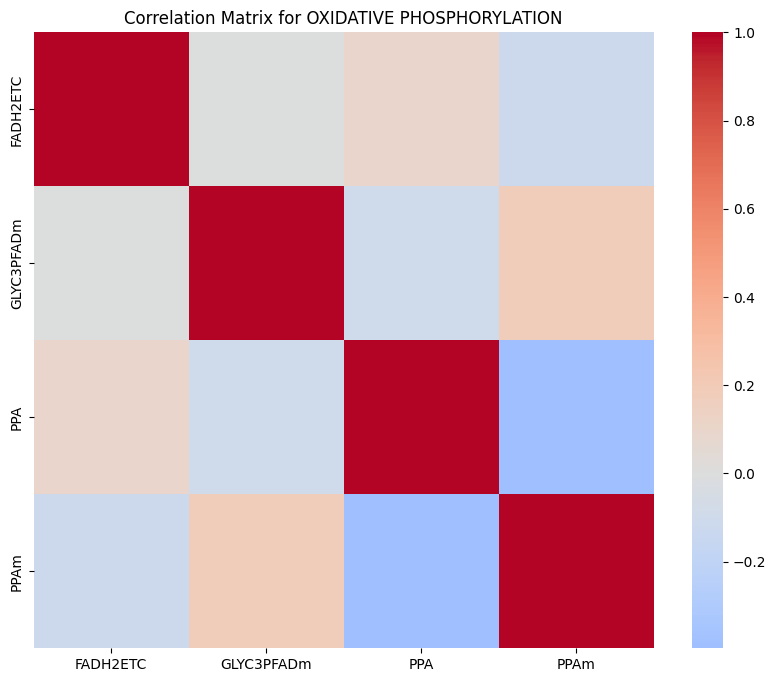

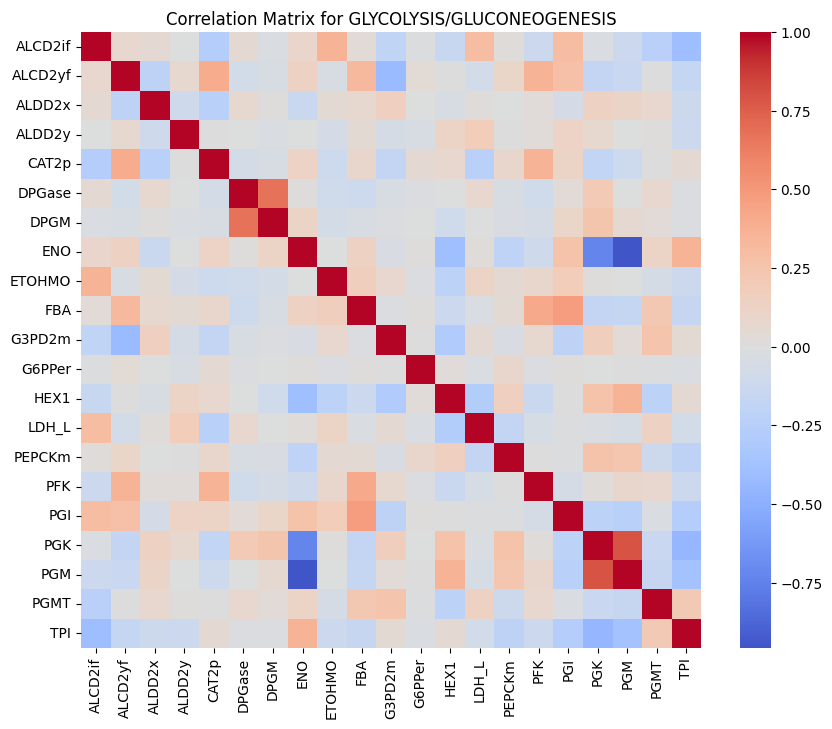

In [12]:
subsystems_interest = ['CITRIC ACID CYCLE', 'OXIDATIVE PHOSPHORYLATION', 'GLYCOLYSIS/GLUCONEOGENESIS']
# for each  of these subsystems, find if the reactions are correlated in the sampled fluxes
for subsystem in subsystems_interest:
    reactions_in_subsystem = [rxn.id for rxn in model.reactions if rxn.subsystem == subsystem]
    subset_samples = samples[reactions_in_subsystem]
    correlation_matrix = subset_samples.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, cmap='coolwarm', center=0)
    plt.title(f'Correlation Matrix for {subsystem}')
    plt.show()

In [ ]:
# compute pairwise correlations and find top 25 pairs by absolute correlation
corr = samples.corr()
# keep upper triangle only (exclude self-correlations)
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
pairs_df = upper.stack().reset_index()
pairs_df.columns = ['rxn1', 'rxn2', 'corr']
pairs_df['abs_corr'] = pairs_df['corr'].abs()
top25 = pairs_df.sort_values('abs_corr', ascending=False).head(25).reset_index(drop=True)

# get subsystem for each reaction (fallback to empty string if not found)
def get_subsystem(rxn_id):
    try:
        return model.reactions.get_by_id(rxn_id).subsystem or ''
    except Exception:
        return ''

top25['subsystem_1'] = top25['rxn1'].map(get_subsystem)
top25['subsystem_2'] = top25['rxn2'].map(get_subsystem)

# print the top 25 pairs with subsystem info
for idx, row in top25.iterrows():
    print(f"{idx+1:2d}. {row['rxn1']} ({row['subsystem_1']})  <->  {row['rxn2']} ({row['subsystem_2']})   corr={row['corr']:.4f}")


 1. ACACT80m ()  <->  3HDH80m ()   corr=1.0000
 2. NACHEX18ly (KERATAN SULFATE DEGRADATION)  <->  NACHEX19ly (KERATAN SULFATE DEGRADATION)   corr=1.0000
 3. 3HDH201n9p ()  <->  3HAD201n9p ()   corr=1.0000
 4. 3HAD201n9p ()  <->  3HDH221n9p ()   corr=1.0000
 5. 3HAD140m ()  <->  ACOAD140m ()   corr=1.0000
 6. 3HDH201n9p ()  <->  ACOAD201n9p ()   corr=1.0000
 7. S6TASE11ly (KERATAN SULFATE DEGRADATION)  <->  SIAASE2ly ()   corr=1.0000
 8. ACOAD224n6p ()  <->  3HDH244n6p ()   corr=1.0000
 9. 3HAD60m ()  <->  ACACT80m ()   corr=1.0000
10. CHOLtg (TRANSPORT, GOLGI APPARATUS)  <->  PCHOLPg_cho ()   corr=1.0000
11. ACACT140m ()  <->  3HAD140m ()   corr=1.0000
12. NACHEX10ly (KERATAN SULFATE DEGRADATION)  <->  SIAASE2ly ()   corr=1.0000
13. ICproduct_GOLGI_MAN1C ()  <->  ICproduct_SECRETION_1 ()   corr=1.0000
14. ACOAD201n9p ()  <->  3HDH221n9p ()   corr=1.0000
15. GALASE3ly (KERATAN SULFATE DEGRADATION)  <->  NACHEX18ly (KERATAN SULFATE DEGRADATION)   corr=1.0000
16. 3HAD60m ()  <->  ACOAD80m

NameError: name 'pd' is not defined

In [13]:
# assign subsystemglycolysis to reaction LDH_D
r3 = model.reactions.get_by_id('LDH_D')
r3.subsystem = 'GLYCOLYSIS/GLUCONEOGENESIS'

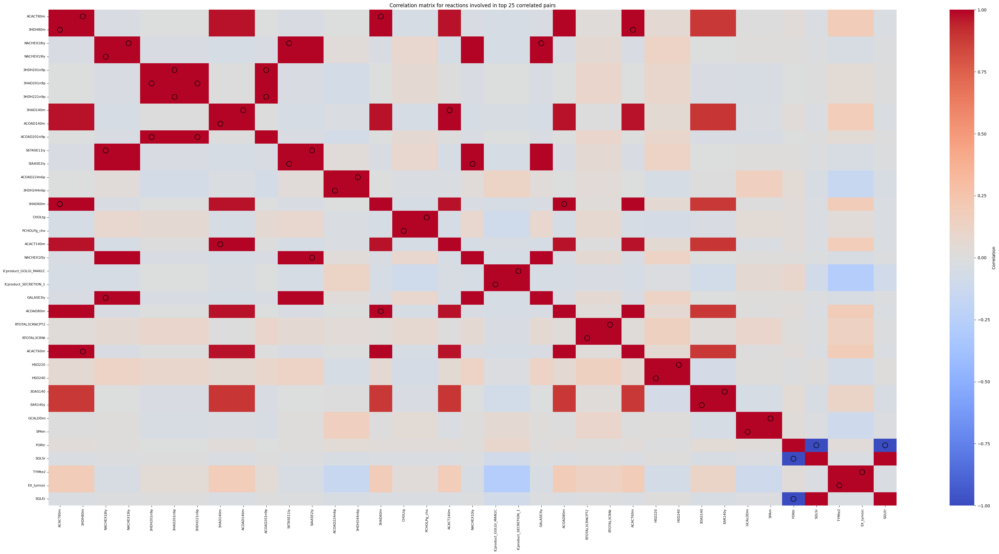

In [35]:

# plot heatmap of correlations among the unique reactions appearing in the top pairs
unique_rxns = list(pd.unique(top25[['rxn1','rxn2']].values.ravel()))
subcorr = corr.loc[unique_rxns, unique_rxns]

plt.figure(figsize=(max(10, len(unique_rxns)), max(8, len(unique_rxns) * 0.5)))
ax = sns.heatmap(subcorr, cmap='coolwarm', center=0, xticklabels=True, yticklabels=True, cbar_kws={'label':'Correlation'})
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=8)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=8)
plt.title('Correlation matrix for reactions involved in top 25 correlated pairs')

# highlight the top pairs on the heatmap
rxn_to_idx = {rxn: i for i, rxn in enumerate(unique_rxns)}
for _, row in top25.iterrows():
    i = rxn_to_idx[row['rxn1']]
    j = rxn_to_idx[row['rxn2']]
    # draw circles at (j, i) and (i, j) to mark both symmetric locations
    ax.scatter([j + 0.5], [i + 0.5], facecolors='none', edgecolors='black', s=150, linewidths=1.2)
    ax.scatter([i + 0.5], [j + 0.5], facecolors='none', edgecolors='black', s=150, linewidths=1.2)

plt.tight_layout()
plt.show()

In [14]:
top_batch1_samples =  {'top_batch1_sampled_fluxes_timepoint_0.pkl',
                       'top_batch1_sampled_fluxes_timepoint_1.pkl',
                       'top_batch1_sampled_fluxes_timepoint_2.pkl',
                       'top_batch1_sampled_fluxes_timepoint_3.pkl',
                       'top_batch1_sampled_fluxes_timepoint_4.pkl',
                       'top_batch1_sampled_fluxes_timepoint_5.pkl',
                       'top_batch1_sampled_fluxes_timepoint_6.pkl',
                       'top_batch1_sampled_fluxes_timepoint_7.pkl',
                       'top_batch1_sampled_fluxes_timepoint_8.pkl',
                       'top_batch1_sampled_fluxes_timepoint_9.pkl',
                       'top_batch1_sampled_fluxes_timepoint_10.pkl'}


In [5]:
#!/usr/bin/env python3
"""
Simple example script showing how to run the flux analysis with your specific files.
"""

from run_flux_analysis import main_script, analyze_custom_files


In [ ]:

# Your exact file list as provided
top_batch1_samples = {
    'top_batch1_sampled_fluxes_timepoint_0.pkl',
    'top_batch1_sampled_fluxes_timepoint_1.pkl',
    'top_batch1_sampled_fluxes_timepoint_2.pkl',
    'top_batch1_sampled_fluxes_timepoint_3.pkl',
    'top_batch1_sampled_fluxes_timepoint_4.pkl',
    'top_batch1_sampled_fluxes_timepoint_5.pkl',
    'top_batch1_sampled_fluxes_timepoint_6.pkl',
    'top_batch1_sampled_fluxes_timepoint_7.pkl',
    'top_batch1_sampled_fluxes_timepoint_8.pkl',
    'top_batch1_sampled_fluxes_timepoint_9.pkl',
    'top_batch1_sampled_fluxes_timepoint_10.pkl'
}




In [14]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
from pathlib import Path
from typing import List, Optional, Dict, Tuple
import warnings


In [20]:
type(model)

cobra.core.model.Model

In [15]:
def analyze_pathway_temporal_distributions(
    pkl_files: List[str], 
    subsystem: str,  # Subsystem/pathway name (e.g., 'Glycolysis/Gluconeogenesis')
    reaction_subset: Optional[List[str]] = None,  # Specific reaction IDs
    data_directory: str = ".",
    figsize: Tuple[int, int] = (15, 10),
    save_plots: bool = True,
    output_directory: str = ".", 
    output_prefix: str = "pathway_analysis",
    model: cobra.core.model.Model = model,
) -> Dict:
    """
    Analyze temporal evolution of flux distributions for a specific metabolic pathway
    using Mann-Whitney U tests and distribution visualizations.
    
    Parameters:
    -----------
    pkl_files : List[str]
        List of pickle file names containing flux data
    model : cobra.Model or similar
        Genome-scale metabolic model with reaction annotations
    subsystem : str
        Subsystem name to analyze (e.g., 'Glycolysis/Gluconeogenesis')
    reaction_subset : List[str], optional
        Specific reaction IDs to analyze. If None, analyze all reactions in subsystem
    data_directory : str
        Directory containing pickle files
    figsize : Tuple[int, int]
        Figure size for plots
    save_plots : bool
        Whether to save plots to disk
    output_prefix : str
        Prefix for saved files
        
    Returns:
    --------
    Dict containing statistical results and analysis summary
    """
    
    def sanitize_filename(name: str) -> str:
        """Clean a string to make it safe for use in filenames."""
        invalid_chars = ['/', '\\', ':', '*', '?', '"', '<', '>', '|', ' ', '(', ')', '[', ']']
        clean_name = name
        for char in invalid_chars:
            clean_name = clean_name.replace(char, '_')
        
        while '__' in clean_name:
            clean_name = clean_name.replace('__', '_')
        
        clean_name = clean_name.strip('_')
        return clean_name
    
    print(f"🔬 PATHWAY TEMPORAL DISTRIBUTION ANALYSIS")
    print(f"🔬 " + "="*45)
    print(f"📊 Subsystem: {subsystem}")
    print(f"📁 Files: {len(pkl_files)}")
    
    # Step 1: Extract reactions from model using your method
    reactions_in_subsystem = [rxn.id for rxn in model.reactions if rxn.subsystem == subsystem]
    
    if not reactions_in_subsystem:
        print(f"❌ No reactions found in subsystem '{subsystem}'!")
        available_subsystems = list(set([rxn.subsystem for rxn in model.reactions if rxn.subsystem]))
        print(f"Available subsystems: {available_subsystems[:5]}... (showing first 5)")
        return None
    
    print(f"⚗️  Reactions in subsystem: {len(reactions_in_subsystem)}")
    
    # Create mapping from reaction IDs to indices in the flux data
    all_reaction_ids = [rxn.id for rxn in model.reactions]
    reaction_id_to_index = {rxn_id: idx for idx, rxn_id in enumerate(all_reaction_ids)}
    
    # Get indices for our target reactions
    target_reaction_indices = [reaction_id_to_index[rxn_id] for rxn_id in reactions_in_subsystem 
                              if rxn_id in reaction_id_to_index]
    
    if len(target_reaction_indices) != len(reactions_in_subsystem):
        missing_reactions = [rxn for rxn in reactions_in_subsystem if rxn not in reaction_id_to_index]
        print(f"⚠️  Warning: {len(missing_reactions)} reactions not found in flux data: {missing_reactions[:3]}...")
    
    print(f"✅ Mapped {len(target_reaction_indices)} reactions to flux data indices")
    
    # Step 2: Select reactions to analyze
    if reaction_subset is None:
        # Analyze all reactions in subsystem
        reactions_to_analyze_ids = reactions_in_subsystem
        reactions_to_analyze_indices = target_reaction_indices
    else:
        # Filter to specific reaction IDs
        reactions_to_analyze_ids = [rxn_id for rxn_id in reaction_subset if rxn_id in reactions_in_subsystem]
        reactions_to_analyze_indices = [reaction_id_to_index[rxn_id] for rxn_id in reactions_to_analyze_ids]
        
        if len(reactions_to_analyze_ids) != len(reaction_subset):
            missing = [rxn for rxn in reaction_subset if rxn not in reactions_in_subsystem]
            print(f"⚠️  Some requested reactions not in subsystem: {missing}")
    
    print(f"🎯 Analyzing {len(reactions_to_analyze_ids)} reactions:")
    for rxn_id in reactions_to_analyze_ids[:5]:  # Show first 5
        print(f"  - {rxn_id}")
    if len(reactions_to_analyze_ids) > 5:
        print(f"  ... and {len(reactions_to_analyze_ids) - 5} more")
    
    # Step 3: Load flux data
    def load_flux_data():
        timepoint_data = []
        valid_timepoints = []
        
        for i, filename in enumerate(sorted(pkl_files)):
            filepath = Path(data_directory) / filename
            
            try:
                with open(filepath, 'rb') as f:
                    data = pickle.load(f)
                
                data_array = np.array(data)
                
                # Check data quality
                finite_mask = np.all(np.isfinite(data_array), axis=1)
                clean_data = data_array[finite_mask]
                
                if len(clean_data) < 100:  # Minimum samples threshold
                    print(f"⚠️  Skipping {filename}: only {len(clean_data)} valid samples")
                    timepoint_data.append(None)
                    continue
                
                timepoint_data.append(clean_data)
                valid_timepoints.append(i)
                
                print(f"✅ {filename}: {clean_data.shape[0]} samples, {clean_data.shape[1]} reactions")
                
            except Exception as e:
                print(f"❌ Error loading {filename}: {e}")
                timepoint_data.append(None)
        
        return timepoint_data, valid_timepoints
    
    flux_data, valid_timepoints = load_flux_data()
    
    if len(valid_timepoints) < 2:
        print(f"❌ Need at least 2 valid timepoints for analysis. Found {len(valid_timepoints)}")
        return None
    
    print(f"📈 Valid timepoints for analysis: {valid_timepoints}")
    
    # Step 4: Mann-Whitney U analysis function
    def mann_whitney_analysis(group1, group2):
        """Perform Mann-Whitney U test and calculate effect size."""
        try:
            # Remove any remaining NaN/inf values
            group1_clean = group1[np.isfinite(group1)]
            group2_clean = group2[np.isfinite(group2)]
            
            if len(group1_clean) < 10 or len(group2_clean) < 10:
                return None, None, None
            
            # Mann-Whitney U test
            statistic, p_value = mannwhitneyu(group1_clean, group2_clean, alternative='two-sided')
            
            # Effect size (rank-biserial correlation)
            n1, n2 = len(group1_clean), len(group2_clean)
            r = 1 - (2 * statistic) / (n1 * n2)
            
            return statistic, p_value, r
            
        except Exception as e:
            print(f"⚠️  Mann-Whitney U test failed: {e}")
            return None, None, None
    
    # Step 5: Analysis and plotting
    results = {
        'subsystem': subsystem,
        'valid_timepoints': valid_timepoints,
        'reaction_ids': reactions_to_analyze_ids,
        'statistical_results': {},
        'significant_transitions': []
    }
    
    # Create figure for each reaction
    for i, reaction_id in enumerate(reactions_to_analyze_ids):
        reaction_index = reactions_to_analyze_indices[i]
        
        print(f"\n📊 Analyzing {reaction_id}...")
        
        # Prepare data for this reaction
        reaction_results = {
            'timepoint_comparisons': [],
            'p_values': [],
            'effect_sizes': [],
            'statistics': []
        }
        
        # Sequential pairwise comparisons
        n_comparisons = len(valid_timepoints) - 1
        
        if n_comparisons > 0:
            fig, axes = plt.subplots(n_comparisons, 1, figsize=(figsize[0], figsize[1] * n_comparisons / 3))
            if n_comparisons == 1:
                axes = [axes]
            
            for j in range(n_comparisons):
                tp1_idx = valid_timepoints[j]
                tp2_idx = valid_timepoints[j + 1]
                
                # Extract flux data for this reaction at both timepoints
                flux1 = flux_data[tp1_idx][:, reaction_index]
                flux2 = flux_data[tp2_idx][:, reaction_index]
                
                # Mann-Whitney U test
                statistic, p_value, r = mann_whitney_analysis(flux1, flux2)
                
                if statistic is not None:
                    # Store results
                    comparison_name = f"t{tp1_idx}_vs_t{tp2_idx}"
                    reaction_results['timepoint_comparisons'].append(comparison_name)
                    reaction_results['p_values'].append(p_value)
                    reaction_results['effect_sizes'].append(r)
                    reaction_results['statistics'].append(statistic)
                    
                    # Check significance
                    is_significant = p_value < 0.05
                    if is_significant:
                        results['significant_transitions'].append({
                            'reaction_id': reaction_id,
                            'comparison': comparison_name,
                            'p_value': p_value,
                            'effect_size': r
                        })
                    
                    # Create distribution plot
                    ax = axes[j]
                    
                    # Plot distributions
                    ax.hist(flux1, bins=50, alpha=0.6, density=True, label=f'Timepoint {tp1_idx}', color='skyblue')
                    ax.hist(flux2, bins=50, alpha=0.6, density=True, label=f'Timepoint {tp2_idx}', color='lightcoral')
                    
                    # Add vertical lines for medians
                    ax.axvline(np.median(flux1), color='blue', linestyle='--', alpha=0.8, label=f'Median t{tp1_idx}')
                    ax.axvline(np.median(flux2), color='red', linestyle='--', alpha=0.8, label=f'Median t{tp2_idx}')
                    
                    # Formatting
                    ax.set_xlabel('Flux Value')
                    ax.set_ylabel('Density')
                    ax.set_title(f'{reaction_id}: {comparison_name}')
                    ax.legend()
                    ax.grid(True, alpha=0.3)
                    
                    # Add statistical annotation
                    significance_marker = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < 0.05 else "ns"
                    effect_interpretation = "Large" if abs(r) > 0.5 else "Medium" if abs(r) > 0.3 else "Small"
                    
                    stats_text = f'p = {p_value:.2e} {significance_marker}\nr = {r:.3f} ({effect_interpretation})'
                    ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
                           verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
                    
                    print(f"  {comparison_name}: p={p_value:.2e}, r={r:.3f} ({significance_marker})")
                
                else:
                    print(f"  {comparison_name}: Analysis failed")
            
            plt.tight_layout()
            
            # Save plot with sanitized names
            if save_plots:

                os.makedirs(output_directory, exist_ok=True)
                subsystem_clean = sanitize_filename(subsystem)
                reaction_clean = sanitize_filename(reaction_id)
                plot_filename = os.path.join(output_directory, f"{output_prefix}_{subsystem_clean}_{reaction_clean}_temporal.png")
                
                plt.savefig(plot_filename, dpi=300, bbox_inches='tight')
                print(f"💾 Saved plot: {plot_filename}")
            
            plt.show()
        
        # Store reaction results
        results['statistical_results'][reaction_id] = reaction_results
    
    # Step 6: Summary analysis
    print(f"\n📋 ANALYSIS SUMMARY")
    print(f"=" * 30)
    print(f"Subsystem: {subsystem}")
    print(f"Reactions analyzed: {len(reactions_to_analyze_ids)}")
    print(f"Sequential comparisons: {len(valid_timepoints) - 1}")
    print(f"Significant transitions found: {len(results['significant_transitions'])}")
    
    if results['significant_transitions']:
        print(f"\n🎯 Significant Transitions:")
        for transition in results['significant_transitions']:
            print(f"  {transition['reaction_id']} - {transition['comparison']}: "
                  f"p={transition['p_value']:.2e}, r={transition['effect_size']:.3f}")
    
    # Multiple testing correction warning
    total_tests = len(reactions_to_analyze_ids) * (len(valid_timepoints) - 1)
    if total_tests > 10:
        bonferroni_alpha = 0.05 / total_tests
        print(f"\n⚠️  Multiple Testing Consideration:")
        print(f"Total tests performed: {total_tests}")
        print(f"Bonferroni-corrected α: {bonferroni_alpha:.2e}")
        
        corrected_significant = [t for t in results['significant_transitions'] 
                               if t['p_value'] < bonferroni_alpha]
        print(f"Significant after correction: {len(corrected_significant)}")
    
    return results


In [ ]:


# Your file list
pkl_files = [
    'top_batch1_sampled_fluxes_timepoint_0.pkl',
    'top_batch1_sampled_fluxes_timepoint_1.pkl',
    'top_batch1_sampled_fluxes_timepoint_2.pkl',
    'top_batch1_sampled_fluxes_timepoint_3.pkl',
    'top_batch1_sampled_fluxes_timepoint_4.pkl',
    'top_batch1_sampled_fluxes_timepoint_5.pkl',
    'top_batch1_sampled_fluxes_timepoint_6.pkl',
    'top_batch1_sampled_fluxes_timepoint_7.pkl',
    'top_batch1_sampled_fluxes_timepoint_8.pkl',
    'top_batch1_sampled_fluxes_timepoint_9.pkl',
    'top_batch1_sampled_fluxes_timepoint_10.pkl'
]


# Analyze glycolysis with actual reaction IDs
results = analyze_pathway_temporal_distributions(
    pkl_files=pkl_files,
    model=model,  # Your model object
    subsystem='GLYCOLYSIS/GLUCONEOGENESIS',  # Exact subsystem name from your model
    reaction_subset=None,  # Analyze all reactions in subsystem
    save_plots=True,
    output_directory= 'Glycolysis_batch_top1',
    output_prefix="glycolysis_analysis"
)

# # Or analyze specific reactions only
# specific_reactions = ['HEX1', 'PFK', 'PYK']  # Use actual reaction IDs
# results_subset = analyze_pathway_temporal_distributions(
#     pkl_files=pkl_files,
#     model=model,
#     subsystem='Glycolysis/Gluconeogenesis', 
#     reaction_subset=specific_reactions,
#     save_plots=True,
#     output_prefix="glycolysis_key_reactions"
# )

In [ ]:
# Analyze glycolysis with actual reaction IDs
results = analyze_pathway_temporal_distributions(
    pkl_files=pkl_files,
    model=model,  # Your model object
    subsystem='PENTOSE PHOSPHATE PATHWAY',  # Exact subsystem name from your model
    reaction_subset=None,  # Analyze all reactions in subsystem
    save_plots=True,
    output_directory= 'PPP_batch_top1',
    output_prefix="PPP_analysis"
)

## between batches comparision
comparing bottom batch and top batch


In [16]:
bottom_batch1_samples = [
    'bottom_batch1_sampled_fluxes_timepoint_0.pkl',
    'bottom_batch1_sampled_fluxes_timepoint_3.pkl',
    'bottom_batch1_sampled_fluxes_timepoint_4.pkl',
    'bottom_batch1_sampled_fluxes_timepoint_5.pkl',
    'bottom_batch1_sampled_fluxes_timepoint_6.pkl',
    'bottom_batch1_sampled_fluxes_timepoint_7.pkl',
    'bottom_batch1_sampled_fluxes_timepoint_8.pkl',
    'bottom_batch1_sampled_fluxes_timepoint_9.pkl',
    'bottom_batch1_sampled_fluxes_timepoint_10.pkl']
top_batch1_samples = [
    'top_batch1_sampled_fluxes_timepoint_0.pkl',
    'top_batch1_sampled_fluxes_timepoint_1.pkl',
    'top_batch1_sampled_fluxes_timepoint_2.pkl',
    'top_batch1_sampled_fluxes_timepoint_3.pkl',
    'top_batch1_sampled_fluxes_timepoint_4.pkl',
    'top_batch1_sampled_fluxes_timepoint_5.pkl',
    'top_batch1_sampled_fluxes_timepoint_6.pkl',
    'top_batch1_sampled_fluxes_timepoint_7.pkl',
    'top_batch1_sampled_fluxes_timepoint_8.pkl',
    'top_batch1_sampled_fluxes_timepoint_9.pkl',
    'top_batch1_sampled_fluxes_timepoint_10.pkl'
]

In [17]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
from pathlib import Path
from typing import List, Optional, Dict, Tuple, Any
import warnings
import os
import re


In [41]:

def compare_batch_temporal_distributions(
    pkl_files_batch1: List[str],
    pkl_files_batch2: List[str],
    model: Any,
    key_reactions: List[str],
    data_directory: str = ".",
    output_directory: str = ".",
    output_prefix: str = "batch_comparison",
    figsize: Tuple[int, int] = (20, 12),
    save_plots: bool = True
) -> Dict:
    """
    Compare temporal evolution of flux distributions between two batches
    for specific key reactions using Mann-Whitney U tests.
    
    Parameters:
    -----------
    pkl_files_batch1 : List[str]
        Batch 1 pickle file names
    pkl_files_batch2 : List[str]  
        Batch 2 pickle file names
    model : Any
        Genome-scale metabolic model
    subsystem : str
        Subsystem name to analyze
    key_reactions : List[str]
        Array of specific reaction IDs to analyze
    data_directory : str
        Directory containing pickle files
    output_directory : str
        Directory for output files
    output_prefix : str
        Prefix for output files
    figsize : Tuple[int, int]
        Figure size for plots
    save_plots : bool
        Whether to save plots
        
    Returns:
    --------
    Dict containing comparison results
    """
    
    def sanitize_filename(name: str) -> str:
        """Clean a string to make it safe for use in filenames."""
        invalid_chars = ['/', '\\', ':', '*', '?', '"', '<', '>', '|', ' ', '(', ')', '[', ']']
        clean_name = name
        for char in invalid_chars:
            clean_name = clean_name.replace(char, '_')
        while '__' in clean_name:
            clean_name = clean_name.replace('__', '_')
        return clean_name.strip('_')
    
    def extract_timepoint(filename: str) -> Optional[int]:
        """Extract timepoint number from filename."""
        match = re.search(r'timepoint_(\d+)', filename)
        return int(match.group(1)) if match else None
    
    def mann_whitney_analysis(group1, group2):
        """Perform Mann-Whitney U test and calculate effect size."""
        try:
            group1_clean = group1[np.isfinite(group1)]
            group2_clean = group2[np.isfinite(group2)]
            
            if len(group1_clean) < 10 or len(group2_clean) < 10:
                return None, None, None
            
            statistic, p_value = mannwhitneyu(group1_clean, group2_clean, alternative='two-sided')
            
            # Effect size (rank-biserial correlation)
            n1, n2 = len(group1_clean), len(group2_clean)
            r = 1 - (2 * statistic) / (n1 * n2)
            
            return statistic, p_value, r
            
        except Exception as e:
            print(f"⚠️  Mann-Whitney U test failed: {e}")
            return None, None, None
    
    print(f"🔬 BATCH TEMPORAL COMPARISON ANALYSIS")
    print(f"🔬 " + "="*50)
    print(f"📁 Batch 1 files: {len(pkl_files_batch1)}")
    print(f"📁 Batch 2 files: {len(pkl_files_batch2)}")
    print(f"🎯 Key reactions: {len(key_reactions)}")
    
    # Step 1: Extract timepoints and create mappings
    batch1_timepoints = {}
    batch2_timepoints = {}
    
    for filename in pkl_files_batch1:
        tp = extract_timepoint(filename)
        if tp is not None:
            batch1_timepoints[tp] = filename
    
    for filename in pkl_files_batch2:
        tp = extract_timepoint(filename)
        if tp is not None:
            batch2_timepoints[tp] = filename
    
    # Find common timepoints
    common_timepoints = sorted(set(batch1_timepoints.keys()) & set(batch2_timepoints.keys()))
    
    print(f"📈 Batch 1 timepoints: {sorted(batch1_timepoints.keys())}")
    print(f"📈 Batch 2 timepoints: {sorted(batch2_timepoints.keys())}")
    print(f"✅ Common timepoints: {common_timepoints}")
    
    if len(common_timepoints) < 2:
        print(f"❌ Need at least 2 common timepoints. Found {len(common_timepoints)}")
        return None
    
    # Step 2: Get reaction indices
    # reactions_in_subsystem = [rxn.id for rxn in model.reactions if rxn.subsystem == subsystem]
    all_reaction_ids = [rxn.id for rxn in model.reactions]
    reaction_id_to_index = {rxn_id: idx for idx, rxn_id in enumerate(all_reaction_ids)}
    
    # Filter key reactions to those in model
    valid_key_reactions = [rxn for rxn in key_reactions]
    key_reaction_indices = [reaction_id_to_index[rxn] for rxn in valid_key_reactions]
    
    if len(valid_key_reactions) != len(key_reactions):
        missing = [rxn for rxn in key_reactions if rxn not in all_reaction_ids]
        print(f"⚠️  Some key reactions not in model: {missing}")
    
    print(f"✅ Analyzing {len(valid_key_reactions)} key reactions: {valid_key_reactions}")
    
    # Step 3: Load data for common timepoints
    def load_batch_data(timepoint_dict, batch_name):
        """Load flux data for a batch."""
        batch_data = {}
        
        for tp in common_timepoints:
            filename = timepoint_dict[tp]
            filepath = Path(data_directory) / filename
            
            try:
                with open(filepath, 'rb') as f:
                    data = pickle.load(f)
                
                data_array = np.array(data)
                finite_mask = np.all(np.isfinite(data_array), axis=1)
                clean_data = data_array[finite_mask]
                
                if len(clean_data) < 50:
                    print(f"⚠️  {batch_name} {filename}: only {len(clean_data)} valid samples")
                    continue
                
                batch_data[tp] = clean_data
                print(f"✅ {batch_name} t{tp}: {clean_data.shape[0]} samples")
                
            except Exception as e:
                print(f"❌ Error loading {batch_name} {filename}: {e}")
        
        return batch_data
    
    batch1_data = load_batch_data(batch1_timepoints, "Batch1")
    batch2_data = load_batch_data(batch2_timepoints, "Batch2")
    
    # Final common timepoints (after loading)
    final_common_timepoints = sorted(set(batch1_data.keys()) & set(batch2_data.keys()))
    print(f"📊 Final analysis timepoints: {final_common_timepoints}")
    
    # Step 4: Analysis results container
    results = {
        'key_reactions': valid_key_reactions,
        'common_timepoints': final_common_timepoints,
        'time_matched_comparisons': {},
        'phase_shift_analysis': {},
        'summary_stats': {}
    }
    
    # Create output directory
    os.makedirs(output_directory, exist_ok=True)
    
    # Step 5: Analysis for each key reaction
    for i, reaction_id in enumerate(valid_key_reactions):
        reaction_index = key_reaction_indices[i]
        
        print(f"\n🧬 Analyzing reaction: {reaction_id}")
        
        # Containers for this reaction
        time_matched_results = []
        batch1_sequential_results = []
        batch2_sequential_results = []
        
        # Time-matched comparisons (Batch1_t vs Batch2_t)
        for tp in final_common_timepoints:
            batch1_flux = batch1_data[tp][:, reaction_index]
            batch2_flux = batch2_data[tp][:, reaction_index]
            
            statistic, p_value, r = mann_whitney_analysis(batch1_flux, batch2_flux)
            
            if statistic is not None:
                time_matched_results.append({
                    'timepoint': tp,
                    'p_value': p_value,
                    'effect_size': r,
                    'batch1_median': np.median(batch1_flux),
                    'batch2_median': np.median(batch2_flux),
                    'significant': p_value < 0.05
                })
        
        # Within-batch sequential comparisons (for phase shift detection)
        def analyze_sequential_changes(batch_data, batch_name):
            sequential_results = []
            timepoints = sorted(batch_data.keys())
            
            for j in range(len(timepoints) - 1):
                tp1, tp2 = timepoints[j], timepoints[j + 1]
                flux1 = batch_data[tp1][:, reaction_index]
                flux2 = batch_data[tp2][:, reaction_index]
                
                statistic, p_value, r = mann_whitney_analysis(flux1, flux2)
                
                if statistic is not None:
                    sequential_results.append({
                        'comparison': f't{tp1}_vs_t{tp2}',
                        'timepoints': (tp1, tp2),
                        'p_value': p_value,
                        'effect_size': r,
                        'significant': p_value < 0.05
                    })
            
            return sequential_results
        
        batch1_sequential_results = analyze_sequential_changes(batch1_data, "Batch1")
        batch2_sequential_results = analyze_sequential_changes(batch2_data, "Batch2")
        
        # Store results for this reaction
        results['time_matched_comparisons'][reaction_id] = time_matched_results
        results['phase_shift_analysis'][reaction_id] = {
            'batch1_transitions': batch1_sequential_results,
            'batch2_transitions': batch2_sequential_results
        }
        
        # Step 6: Create comprehensive plot for this reaction
        n_timepoints = len(final_common_timepoints)
        
        # Calculate appropriate subplot grid
        n_cols = min(4, n_timepoints)  # Max 4 columns
        n_rows = (n_timepoints + n_cols - 1) // n_cols  # Ceiling division
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
        if n_timepoints == 1:
            axes = [axes]
        elif n_rows == 1:
            axes = [axes] if n_cols == 1 else axes
        else:
            axes = axes.flatten() if n_timepoints > n_cols else axes
        
        # Plot each timepoint comparison
        for idx, tp in enumerate(final_common_timepoints):
            ax = axes[idx] if isinstance(axes, (list, np.ndarray)) else axes
            
            # Get flux data
            batch1_flux = batch1_data[tp][:, reaction_index]
            batch2_flux = batch2_data[tp][:, reaction_index]
            
            # Auto-scale for visualization if values are very small
            combined_fluxes = np.concatenate([batch1_flux, batch2_flux])
            flux_magnitude = np.mean(np.abs(combined_fluxes[combined_fluxes != 0]))
            
            if flux_magnitude < 1e-6:
                scale_factor = 10 ** (-np.floor(np.log10(flux_magnitude)))
                batch1_display = batch1_flux * scale_factor
                batch2_display = batch2_flux * scale_factor
                xlabel = f'Flux Value (×{scale_factor:.0e})'
            else:
                batch1_display = batch1_flux
                batch2_display = batch2_flux
                xlabel = 'Flux Value'
            
            # Plot distributions
            ax.hist(batch1_display, bins=30, alpha=0.6, density=True, 
                   label='Batch 1', color='skyblue', edgecolor='blue', linewidth=0.5)
            ax.hist(batch2_display, bins=30, alpha=0.6, density=True, 
                   label='Batch 2', color='lightcoral', edgecolor='red', linewidth=0.5)
            
            # Add medians
            ax.axvline(np.median(batch1_display), color='blue', linestyle='--', 
                      alpha=0.8, label='Batch 1 median')
            ax.axvline(np.median(batch2_display), color='red', linestyle='--', 
                      alpha=0.8, label='Batch 2 median')
            
            # Get statistics for this timepoint
            time_match_stat = next((tm for tm in time_matched_results if tm['timepoint'] == tp), None)
            
            if time_match_stat:
                p_val = time_match_stat['p_value']
                r_val = time_match_stat['effect_size']
                
                # Significance marker
                sig_marker = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else "ns"
                effect_size = "Large" if abs(r_val) > 0.5 else "Medium" if abs(r_val) > 0.3 else "Small"
                
                # Add statistics text
                stats_text = f'p = {p_val:.2e} {sig_marker}\nr = {r_val:.3f} ({effect_size})'
                ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
                       verticalalignment='top', fontsize=9,
                       bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
            
            # Formatting
            ax.set_xlabel(xlabel, fontsize=10)
            ax.set_ylabel('Density', fontsize=10)
            ax.set_title(f'Timepoint {tp}', fontsize=11)
            if idx == 0:  # Only show legend on first subplot
                ax.legend(fontsize=9)
            ax.grid(True, alpha=0.3)
        
        # Hide empty subplots
        if isinstance(axes, (list, np.ndarray)):
            for idx in range(len(final_common_timepoints), len(axes)):
                axes[idx].set_visible(False)
        
        # Add overall title and phase shift info
        plt.suptitle(f'{reaction_id} - Batch Comparison\n', 
                    fontsize=14, fontweight='bold')
        
        # Add phase shift summary as text
        batch1_significant = [t for t in batch1_sequential_results if t['significant']]
        batch2_significant = [t for t in batch2_sequential_results if t['significant']]
        
        phase_text = f"Phase Analysis:\nBatch 1 transitions: {[t['comparison'] for t in batch1_significant]}\n"
        phase_text += f"Batch 2 transitions: {[t['comparison'] for t in batch2_significant]}"
        
        plt.figtext(0.02, 0.02, phase_text, fontsize=9, 
                   bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.7))
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.9, bottom=0.15)
        
        # Save plot
        if save_plots:
            # subsystem_clean = sanitize_filename(subsystem)
            reaction_clean = sanitize_filename(reaction_id)
            plot_filename = os.path.join(output_directory, 
                                       f"{output_prefix}_{reaction_clean}_batch_comparison.png")
            plt.savefig(plot_filename, dpi=300, bbox_inches='tight')
            print(f"💾 Saved plot: {plot_filename}")
        
        plt.show()
        
        # Print summary for this reaction
        significant_timepoints = [tm['timepoint'] for tm in time_matched_results if tm['significant']]
        print(f"  📊 Significant batch differences at timepoints: {significant_timepoints}")
        
        if batch1_significant:
            print(f"  🔄 Batch 1 transitions: {[t['comparison'] for t in batch1_significant]}")
        if batch2_significant:
            print(f"  🔄 Batch 2 transitions: {[t['comparison'] for t in batch2_significant]}")
    
    # Step 7: Generate summary statistics
    print(f"\n📋 BATCH COMPARISON SUMMARY")
    print(f"=" * 40)
    
    for reaction_id in valid_key_reactions:
        time_matched = results['time_matched_comparisons'][reaction_id]
        significant_count = sum(1 for tm in time_matched if tm['significant'])
        
        print(f"\n{reaction_id}:")
        print(f"  Significant timepoints: {significant_count}/{len(time_matched)}")
        
        if significant_count > 0:
            sig_timepoints = [tm['timepoint'] for tm in time_matched if tm['significant']]
            max_effect = max([abs(tm['effect_size']) for tm in time_matched if tm['significant']])
            print(f"  Timepoints with differences: {sig_timepoints}")
            print(f"  Maximum effect size: {max_effect:.3f}")
    
    # Multiple testing warning
    total_tests = len(valid_key_reactions) * len(final_common_timepoints)
    bonferroni_alpha = 0.05 / total_tests
    print(f"\n⚠️  Multiple Testing Consideration:")
    print(f"Total tests: {total_tests}")
    print(f"Bonferroni-corrected α: {bonferroni_alpha:.2e}")
    
    results['summary_stats'] = {
        'total_tests': total_tests,
        'bonferroni_alpha': bonferroni_alpha,
        'reactions_analyzed': len(valid_key_reactions),
        'timepoints_analyzed': len(final_common_timepoints)
    }
    
    return results


🔬 BATCH TEMPORAL COMPARISON ANALYSIS
🔬 ==================================================
📁 Batch 1 files: 11
📁 Batch 2 files: 9
🎯 Key reactions: 3
📈 Batch 1 timepoints: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
📈 Batch 2 timepoints: [0, 3, 4, 5, 6, 7, 8, 9, 10]
✅ Common timepoints: [0, 3, 4, 5, 6, 7, 8, 9, 10]
✅ Analyzing 3 key reactions: ['HEX1', 'PFK', 'PYK']
✅ Batch1 t0: 5000 samples
✅ Batch1 t3: 5000 samples
✅ Batch1 t4: 5000 samples
✅ Batch1 t5: 5000 samples
✅ Batch1 t6: 5000 samples
✅ Batch1 t7: 5000 samples
✅ Batch1 t8: 5000 samples
✅ Batch1 t9: 5000 samples
✅ Batch1 t10: 5000 samples
✅ Batch2 t0: 5000 samples
✅ Batch2 t3: 5000 samples
✅ Batch2 t4: 5000 samples
✅ Batch2 t5: 5000 samples
✅ Batch2 t6: 5000 samples
✅ Batch2 t7: 5000 samples
✅ Batch2 t8: 5000 samples
❌ Error loading Batch2 bottom_batch1_sampled_fluxes_timepoint_9.pkl: [Errno 2] No such file or directory: 'bottom_batch1_sampled_fluxes_timepoint_9.pkl'
✅ Batch2 t10: 5000 samples
📊 Final analysis timepoints: [0, 3, 4, 5, 6, 

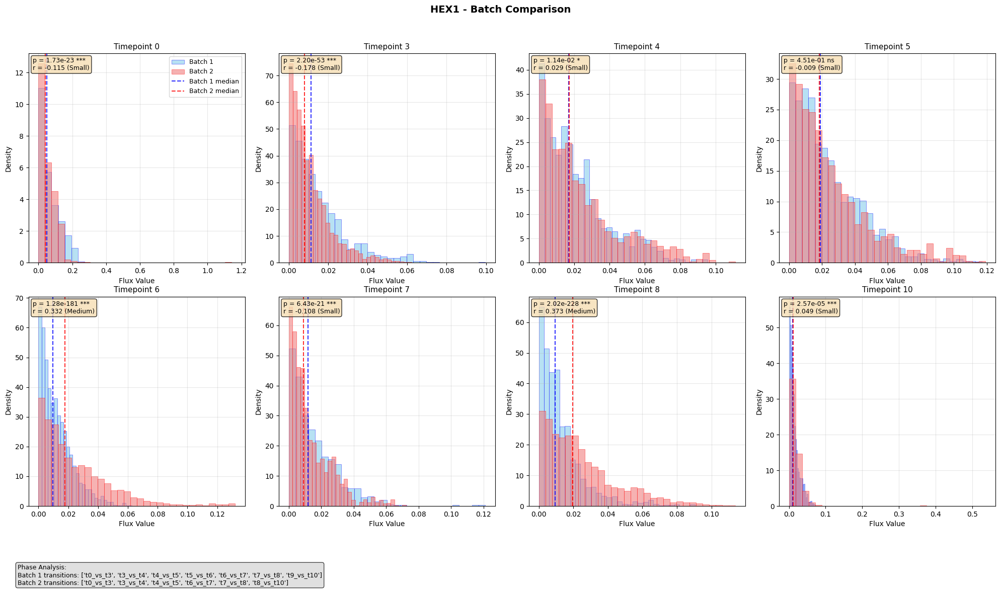

  📊 Significant batch differences at timepoints: [0, 3, 4, 6, 7, 8, 10]
  🔄 Batch 1 transitions: ['t0_vs_t3', 't3_vs_t4', 't4_vs_t5', 't5_vs_t6', 't6_vs_t7', 't7_vs_t8', 't9_vs_t10']
  🔄 Batch 2 transitions: ['t0_vs_t3', 't3_vs_t4', 't4_vs_t5', 't6_vs_t7', 't7_vs_t8', 't8_vs_t10']

🧬 Analyzing reaction: PFK
💾 Saved plot: batch_comparison_top1_bottom1_results/glycolysis_batch_comparison_PFK_batch_comparison.png


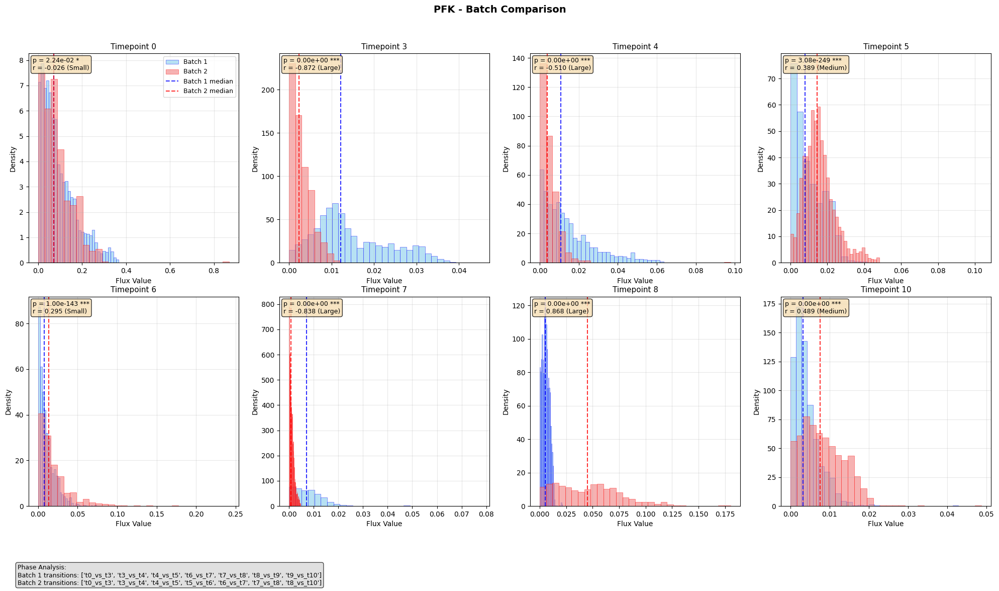

  📊 Significant batch differences at timepoints: [0, 3, 4, 5, 6, 7, 8, 10]
  🔄 Batch 1 transitions: ['t0_vs_t3', 't3_vs_t4', 't4_vs_t5', 't6_vs_t7', 't7_vs_t8', 't8_vs_t9', 't9_vs_t10']
  🔄 Batch 2 transitions: ['t0_vs_t3', 't3_vs_t4', 't4_vs_t5', 't5_vs_t6', 't6_vs_t7', 't7_vs_t8', 't8_vs_t10']

🧬 Analyzing reaction: PYK
💾 Saved plot: batch_comparison_top1_bottom1_results/glycolysis_batch_comparison_PYK_batch_comparison.png


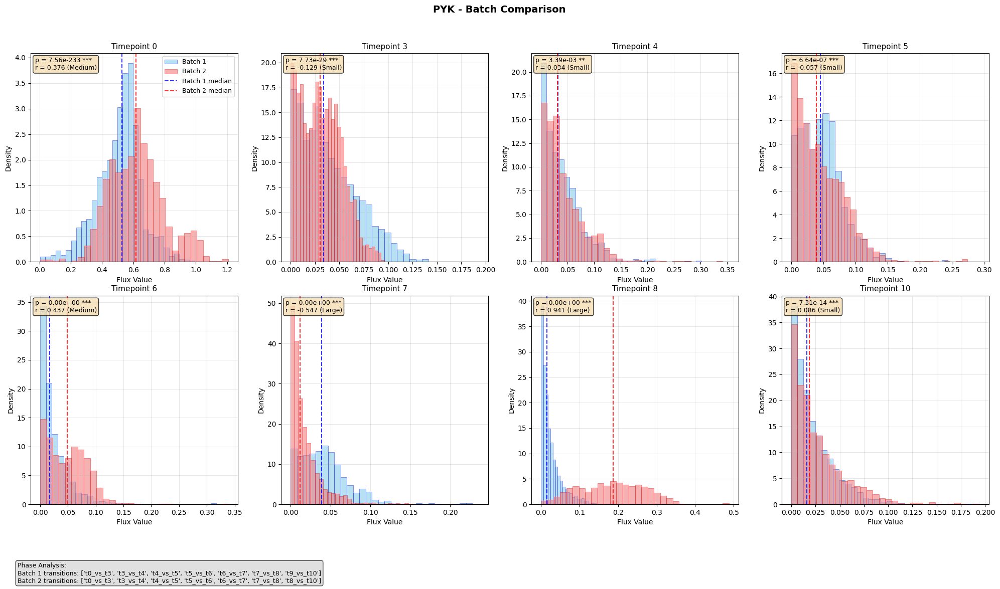

  📊 Significant batch differences at timepoints: [0, 3, 4, 5, 6, 7, 8, 10]
  🔄 Batch 1 transitions: ['t0_vs_t3', 't3_vs_t4', 't4_vs_t5', 't5_vs_t6', 't6_vs_t7', 't7_vs_t8', 't9_vs_t10']
  🔄 Batch 2 transitions: ['t0_vs_t3', 't3_vs_t4', 't4_vs_t5', 't5_vs_t6', 't6_vs_t7', 't7_vs_t8', 't8_vs_t10']

📋 BATCH COMPARISON SUMMARY

HEX1:
  Significant timepoints: 7/8
  Timepoints with differences: [0, 3, 4, 6, 7, 8, 10]
  Maximum effect size: 0.373

PFK:
  Significant timepoints: 8/8
  Timepoints with differences: [0, 3, 4, 5, 6, 7, 8, 10]
  Maximum effect size: 0.872

PYK:
  Significant timepoints: 8/8
  Timepoints with differences: [0, 3, 4, 5, 6, 7, 8, 10]
  Maximum effect size: 0.941

⚠️  Multiple Testing Consideration:
Total tests: 24
Bonferroni-corrected α: 2.08e-03


In [ ]:


key_reactions = ['HEX1', 'PFK', 'PYK']  # Your key reactions

# Load your model
# import cobra
# model = cobra.io.read_sbml_model("your_model.xml")
# key_reactions = ['LDH_D', 'PCm', 'EX_o2(e)', 'MDHm', 'AKGMALtm' ]
results = compare_batch_temporal_distributions(
    pkl_files_batch1=top_batch1_samples,
    pkl_files_batch2=bottom_batch1_samples,
    model=model,
    key_reactions=key_reactions,
    output_directory="batch_comparison_top1_bottom1_results/",
    output_prefix="batch_comparison",
    save_plots=True
)

In [ ]:
key_reactions = ['LDH_D', 'PCm', 'EX_o2(e)', 'MDHm', 'AKGMALtm' ]
# reactions studied: lactate dehydrogenase, pyruvate carboxylase, oxygen exchange, malate dehydrogenase, alpha-ketoglutarate/malate transporter
results = compare_batch_temporal_distributions(
    pkl_files_batch1=top_batch1_samples,
    pkl_files_batch2=bottom_batch1_samples,
    model=model,
    key_reactions=key_reactions,
    output_directory="batch_comparison_top1_bottom1_results/",
    output_prefix="batch_comparison",
    save_plots=True
)

dict_keys([11, 31, 14])
dict_keys([13, 29, 21])


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 2000x600 with 0 Axes>

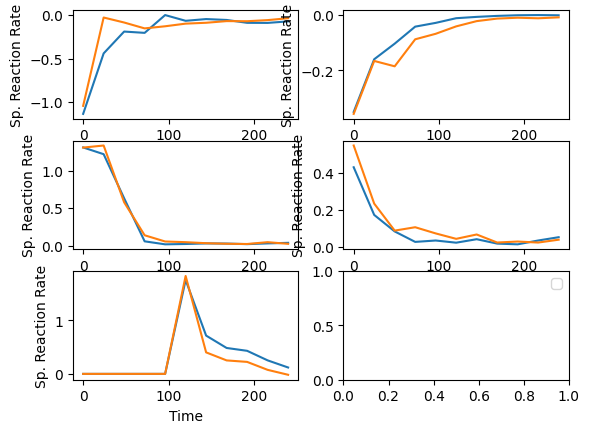

In [77]:
#load the pkl file 'extracted_reaction_rates.pkl'
#plot the sp rates for the first batch
all_sp_rxnrates = pickle.load(open('sp_rates_top_bottom.pkl', 'rb'))
# print(all_sp_rxnrates.keys())
batch1 = all_sp_rxnrates['top']
print(batch1.keys())
batch_low = all_sp_rxnrates['bottom']
print(batch_low.keys())
batch1 = all_sp_rxnrates['top'][31]
batch_low = all_sp_rxnrates['bottom'][21]
# print(batch1)

plt.figure(figsize=(20,6))
fig, ax = plt.subplots(3,2)
for i in range(5):
    ax[i//2, i%2].plot(batch1['times'], batch1['rates'][:,i+1], label=f'high yielding')
    ax[i//2, i%2].plot(batch_low['times'], batch_low['rates'][:,i+1], label=f'low yielding')
    ax[i//2, i%2].set_xlabel('Time')
    ax[i//2, i%2].set_ylabel('Sp. Reaction Rate')
plt.legend()
plt.show()

Reactions to study:
1. 'GLUCYS' : 'GLUTATHIONE METABOLISM' (see if high producers have higher flux during growth?)
2. 'GTHS' : 'GLUTATHIONE METABOLISM'
3. 'LDH_D' :  (lactate dehydrogenase)
4. PGK : (phosphoglycerate kinase)
5. FBA: (fructose-bisphosphate aldolase)
6. TKT1: (transketolase 1) (PPP)
7. TKT2: (transketolase 2) (PPP)
8. GND: (6-phosphogluconate dehydrogenase) (PPP)
9. AAPAOC69 : cys_L[c] + tyr_L[e] <=> cys_L[e] + tyr_L[c]
10. CYSGLUexR : L-cysteine/L-glutamine reversible exchanger
11. CYSATB0tc: transport of L-Cysteine into the intestinal cells by ATB0 transporter
12. ME2 : malic enzyme (NADP)
13. CSm : citrate synthase (mitochondrial) (TCA)
14. PCm : pyruvate carboxylase (mitochondrial) (anaplerotic reaction)
15. MDHm : malate dehydrogenase (mitochondrial) (TCA)
16. PYRt2m : pyruvate transport into mitochondria
17. AKGMALtm : alpha-ketoglutarate/malate transporter (mitochondrial)
18. FUMMALtm : fumarate/malate transporter (mitochondrial)

In [ ]:
key_reactions = ['GLUCYS', 'GTHS', 'LDH_D', 'PGK', 
                 'FBA', 'TKT1',  'TKT2', 'GND', 'AAPAOC69', 'CYSGLUexR',
                  'CYSATB0tc', 'ME2', 'CSm', 'PCm', 'MDHm', 'PYRt2m',
                   'AKGMALtm', 'FUMMALtm' ]
results = compare_batch_temporal_distributions(
    pkl_files_batch1=top_batch1_samples,
    pkl_files_batch2=bottom_batch1_samples,
    model=model,
    key_reactions=key_reactions,
    output_directory="batch_comparison_top1_bottom1_results/",
    output_prefix="batch_comparison",
    save_plots=True
)

In [89]:



def plot_joint_flux_distribution(
    batch1_data: List[str],
    batch2_data: List[str], 
    reaction_pairs: List[Tuple[str, str]],
    model: Any,
    output_directory: str = ".",
    output_prefix: str = "joint_flux_distribution",
    save_plots: bool = True,
    figsize: Tuple[int, int] = (20, 15),
    data_directory: str = ".",
    plot_type: str = "both"  # "scatter", "density", or "both"
) -> Dict:
    """
    Plot joint flux distributions for multiple reaction pairs across timepoints and batches.
    
    Parameters:
    -----------
    batch1_data : List[str]
        List of pickle file names for batch 1
    batch2_data : List[str]
        List of pickle file names for batch 2
    reaction_pairs : List[Tuple[str, str]]
        List of reaction ID pairs to analyze, e.g., [('HEX1', 'PFK'), ('PFK', 'PYK')]
    model : Any
        Genome-scale metabolic model
    output_directory : str
        Directory for saving plots
    output_prefix : str
        Prefix for output files
    save_plots : bool
        Whether to save plots
    figsize : Tuple[int, int]
        Figure size
    data_directory : str
        Directory containing pickle files
    plot_type : str
        Type of plot: "scatter", "density", or "both"
        
    Returns:
    --------
    Dict containing analysis results for all reaction pairs
    """
    
    def sanitize_filename(name: str) -> str:
        """Clean a string to make it safe for use in filenames."""
        invalid_chars = ['/', '\\', ':', '*', '?', '"', '<', '>', '|', ' ', '(', ')', '[', ']']
        clean_name = name
        for char in invalid_chars:
            clean_name = clean_name.replace(char, '_')
        while '__' in clean_name:
            clean_name = clean_name.replace('__', '_')
        return clean_name.strip('_')
    
    def extract_timepoint(filename: str) -> Optional[int]:
        """Extract timepoint number from filename."""
        match = re.search(r'timepoint_(\d+)', filename)
        return int(match.group(1)) if match else None
    
    def load_batch_timepoint_data(file_list, batch_name):
        """Load and organize batch data by timepoints."""
        timepoint_data = {}
        
        print(f"📁 Loading {batch_name} data...")
        for filename in file_list:
            tp = extract_timepoint(filename)
            if tp is None:
                print(f"⚠️  Could not extract timepoint from {filename}")
                continue
                
            filepath = Path(data_directory) / filename
            
            try:
                with open(filepath, 'rb') as f:
                    data = pickle.load(f)
                
                data_array = np.array(data)
                finite_mask = np.all(np.isfinite(data_array), axis=1)
                clean_data = data_array[finite_mask]
                
                if len(clean_data) < 50:
                    print(f"⚠️  {batch_name} {filename}: only {len(clean_data)} valid samples")
                    continue
                
                timepoint_data[tp] = clean_data
                print(f"✅ {batch_name} t{tp}: {clean_data.shape[0]} samples")
                
            except Exception as e:
                print(f"❌ Error loading {batch_name} {filename}: {e}")
        
        return timepoint_data
    
    print(f"🔬 JOINT FLUX DISTRIBUTION ANALYSIS")
    print(f"🔬 " + "="*50)
    print(f"📊 Reaction pairs to analyze: {len(reaction_pairs)}")
    for i, (r1, r2) in enumerate(reaction_pairs, 1):
        print(f"  {i}. {r1} vs {r2}")
    print(f"📁 Batch 1 files: {len(batch1_data)}")
    print(f"📁 Batch 2 files: {len(batch2_data)}")
    
    # Get reaction indices from model
    all_reaction_ids = [rxn.id for rxn in model.reactions]
    reaction_id_to_index = {rxn_id: idx for idx, rxn_id in enumerate(all_reaction_ids)}
    
    # Validate all reactions exist in model
    missing_reactions = []
    for reaction1, reaction2 in reaction_pairs:
        if reaction1 not in reaction_id_to_index:
            missing_reactions.append(reaction1)
        if reaction2 not in reaction_id_to_index:
            missing_reactions.append(reaction2)
    
    if missing_reactions:
        print(f"❌ Missing reactions in model: {set(missing_reactions)}")
        print(f"Available reactions (first 10): {all_reaction_ids[:10]}")
        return None
    
    print(f"✅ All reactions found in model")
    
    # Load data for both batches ONCE
    print(f"\n📂 LOADING BATCH DATA")
    print("=" * 25)
    batch1_timepoint_data = load_batch_timepoint_data(batch1_data, "Batch1")
    batch2_timepoint_data = load_batch_timepoint_data(batch2_data, "Batch2")
    
    # Find common timepoints
    common_timepoints = sorted(set(batch1_timepoint_data.keys()) & set(batch2_timepoint_data.keys()))
    print(f"\n📈 Common timepoints: {common_timepoints}")
    
    if len(common_timepoints) == 0:
        print("❌ No common timepoints found between batches")
        return None
    
    # Create output directory
    os.makedirs(output_directory, exist_ok=True)
    
    # Initialize overall results
    all_results = {
        'common_timepoints': common_timepoints,
        'batch1_timepoint_data_info': {tp: data.shape for tp, data in batch1_timepoint_data.items()},
        'batch2_timepoint_data_info': {tp: data.shape for tp, data in batch2_timepoint_data.items()},
        'reaction_pairs_results': {},
        'successful_pairs': [],
        'failed_pairs': []
    }
    
    # Calculate grid dimensions for subplots
    n_timepoints = len(common_timepoints)
    n_cols = min(4, n_timepoints)
    n_rows = (n_timepoints + n_cols - 1) // n_cols
    
    print(f"\n🧬 ANALYZING REACTION PAIRS")
    print("=" * 30)
    
    # Process each reaction pair
    for pair_idx, (reaction1, reaction2) in enumerate(reaction_pairs, 1):
        print(f"\n🔍 Processing pair {pair_idx}/{len(reaction_pairs)}: {reaction1} vs {reaction2}")
        #print the reaction formula using the genome scale model
        print(f"   Reaction 1 formula: {model.reactions.get_by_id(reaction1).reaction}")
        print(f"   Reaction 2 formula: {model.reactions.get_by_id(reaction2).reaction}")
        try:
            # Get reaction indices
            reaction1_idx = reaction_id_to_index[reaction1]
            reaction2_idx = reaction_id_to_index[reaction2]
            
            # Initialize results for this pair
            pair_results = {
                'reaction1': reaction1,
                'reaction2': reaction2,
                'reaction1_index': reaction1_idx,
                'reaction2_index': reaction2_idx,
                'batch1_samples': {},
                'batch2_samples': {}
            }
            
            # Create scatter plot if requested
            if plot_type in ["scatter", "both"]:
                print(f"  📊 Creating scatter plot...")
                
                fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
                if n_timepoints == 1:
                    axes = [axes]
                elif n_rows == 1:
                    axes = axes if isinstance(axes, np.ndarray) else [axes]
                else:
                    axes = axes.flatten()
                
                for idx, tp in enumerate(common_timepoints):
                    ax = axes[idx]
                    
                    # Get flux data for both reactions and both batches
                    batch1_flux1 = batch1_timepoint_data[tp][:, reaction1_idx]
                    batch1_flux2 = batch1_timepoint_data[tp][:, reaction2_idx]
                    batch2_flux1 = batch2_timepoint_data[tp][:, reaction1_idx]
                    batch2_flux2 = batch2_timepoint_data[tp][:, reaction2_idx]
                    
                    # Store sample data
                    pair_results['batch1_samples'][f't{tp}'] = {
                        'reaction1_flux': batch1_flux1,
                        'reaction2_flux': batch1_flux2
                    }
                    pair_results['batch2_samples'][f't{tp}'] = {
                        'reaction1_flux': batch2_flux1,
                        'reaction2_flux': batch2_flux2
                    }
                    
                    # Auto-scale for visualization
                    all_flux1 = np.concatenate([batch1_flux1, batch2_flux1])
                    all_flux2 = np.concatenate([batch1_flux2, batch2_flux2])
                    
                    # Determine scaling for reaction 1
                    flux1_magnitude = np.mean(np.abs(all_flux1[all_flux1 != 0])) if np.any(all_flux1 != 0) else 1
                    if flux1_magnitude < 1e-6:
                        scale1 = 10 ** (-np.floor(np.log10(flux1_magnitude)))
                        batch1_flux1_display = batch1_flux1 * scale1
                        batch2_flux1_display = batch2_flux1 * scale1
                        xlabel = f'{reaction1} Flux (×{scale1:.0e})'
                    else:
                        batch1_flux1_display = batch1_flux1
                        batch2_flux1_display = batch2_flux1
                        xlabel = f'{reaction1} Flux'
                    
                    # Determine scaling for reaction 2
                    flux2_magnitude = np.mean(np.abs(all_flux2[all_flux2 != 0])) if np.any(all_flux2 != 0) else 1
                    if flux2_magnitude < 1e-6:
                        scale2 = 10 ** (-np.floor(np.log10(flux2_magnitude)))
                        batch1_flux2_display = batch1_flux2 * scale2
                        batch2_flux2_display = batch2_flux2 * scale2
                        ylabel = f'{reaction2} Flux (×{scale2:.0e})'
                    else:
                        batch1_flux2_display = batch1_flux2
                        batch2_flux2_display = batch2_flux2
                        ylabel = f'{reaction2} Flux'
                    
                    # Create scatter plot
                    ax.scatter(batch1_flux1_display, batch1_flux2_display, 
                              alpha=0.6, s=10, color='skyblue', label='Batch 1', edgecolors='blue', linewidth=0.1)
                    ax.scatter(batch2_flux1_display, batch2_flux2_display, 
                              alpha=0.6, s=10, color='lightcoral', label='Batch 2', edgecolors='red', linewidth=0.1)
                    
                    # Add diagonal reference line if both reactions have similar ranges
                    xlim = ax.get_xlim()
                    ylim = ax.get_ylim()
                    if (xlim[1] - xlim[0]) / (ylim[1] - ylim[0]) > 0.1 and (ylim[1] - ylim[0]) / (xlim[1] - xlim[0]) > 0.1:
                        diag_min = max(xlim[0], ylim[0])
                        diag_max = min(xlim[1], ylim[1])
                        ax.plot([diag_min, diag_max], [diag_min, diag_max], 'k--', alpha=0.3, linewidth=1)
                    
                    # Formatting
                    ax.set_xlabel(xlabel, fontsize=10)
                    ax.set_ylabel(ylabel, fontsize=10)
                    ax.set_title(f'Timepoint {tp}', fontsize=11)
                    if idx == 0:
                        ax.legend(fontsize=9)
                    ax.grid(True, alpha=0.3)
                
                # Hide empty subplots
                for idx in range(len(common_timepoints), len(axes)):
                    axes[idx].set_visible(False)
                
                plt.suptitle(f'Joint Flux Distribution: {reaction1} vs {reaction2}\nScatter Plot Comparison', 
                            fontsize=14, fontweight='bold')
                plt.tight_layout()
                
                # Save scatter plot
                if save_plots:
                    scatter_filename = os.path.join(output_directory, 
                                                  f"{output_prefix}_{sanitize_filename(reaction1)}_vs_{sanitize_filename(reaction2)}_scatter.png")
                    plt.savefig(scatter_filename, dpi=300, bbox_inches='tight')
                    print(f"  💾 Saved scatter plot: {os.path.basename(scatter_filename)}")
                
                plt.show()
                plt.close()  # Important: close to free memory
            
            # Create density plot if requested
            if plot_type in ["density", "both"]:
                print(f"  📈 Creating density plot...")
                
                fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
                if n_timepoints == 1:
                    axes = [axes]
                elif n_rows == 1:
                    axes = axes if isinstance(axes, np.ndarray) else [axes]
                else:
                    axes = axes.flatten()
                
                for idx, tp in enumerate(common_timepoints):
                    ax = axes[idx]
                    
                    # Get flux data (already stored in pair_results)
                    batch1_flux1 = pair_results['batch1_samples'][f't{tp}']['reaction1_flux']
                    batch1_flux2 = pair_results['batch1_samples'][f't{tp}']['reaction2_flux']
                    batch2_flux1 = pair_results['batch2_samples'][f't{tp}']['reaction1_flux']
                    batch2_flux2 = pair_results['batch2_samples'][f't{tp}']['reaction2_flux']
                    
                    # Combine for range determination
                    all_flux1 = np.concatenate([batch1_flux1, batch2_flux1])
                    all_flux2 = np.concatenate([batch1_flux2, batch2_flux2])
                    
                    # Determine scaling (same logic as scatter plot)
                    flux1_magnitude = np.mean(np.abs(all_flux1[all_flux1 != 0])) if np.any(all_flux1 != 0) else 1
                    flux2_magnitude = np.mean(np.abs(all_flux2[all_flux2 != 0])) if np.any(all_flux2 != 0) else 1
                    
                    if flux1_magnitude < 1e-6:
                        scale1 = 10 ** (-np.floor(np.log10(flux1_magnitude)))
                        batch1_flux1_display = batch1_flux1 * scale1
                        batch2_flux1_display = batch2_flux1 * scale1
                        xlabel = f'{reaction1} Flux (×{scale1:.0e})'
                    else:
                        batch1_flux1_display = batch1_flux1
                        batch2_flux1_display = batch2_flux1
                        xlabel = f'{reaction1} Flux'
                        
                    if flux2_magnitude < 1e-6:
                        scale2 = 10 ** (-np.floor(np.log10(flux2_magnitude)))
                        batch1_flux2_display = batch1_flux2 * scale2
                        batch2_flux2_display = batch2_flux2 * scale2
                        ylabel = f'{reaction2} Flux (×{scale2:.0e})'
                    else:
                        batch1_flux2_display = batch1_flux2
                        batch2_flux2_display = batch2_flux2
                        ylabel = f'{reaction2} Flux'
                    
                    # Create 2D histogram/density plot
                    # Determine common range for both batches
                    all_x = np.concatenate([batch1_flux1_display, batch2_flux1_display])
                    all_y = np.concatenate([batch1_flux2_display, batch2_flux2_display])
                    
                    x_range = [np.percentile(all_x, 1), np.percentile(all_x, 99)]
                    y_range = [np.percentile(all_y, 1), np.percentile(all_y, 99)]
                    
                    # Create density plots for both batches
                    try:
                        # Batch 1 density (blue)
                        ax.hexbin(batch1_flux1_display, batch1_flux2_display, 
                                 gridsize=20, alpha=0.6, cmap='Blues', 
                                 extent=[x_range[0], x_range[1], y_range[0], y_range[1]],
                                 mincnt=1)
                        
                        # Batch 2 density (red) - overlay
                        im = ax.hexbin(batch2_flux1_display, batch2_flux2_display, 
                                      gridsize=20, alpha=0.6, cmap='Reds',
                                      extent=[x_range[0], x_range[1], y_range[0], y_range[1]], 
                                      mincnt=1)
                        
                    except Exception as e:
                        # Fallback to scatter if hexbin fails
                        print(f"    ⚠️  Hexbin failed for timepoint {tp}, using scatter: {e}")
                        ax.scatter(batch1_flux1_display, batch1_flux2_display, 
                                  alpha=0.4, s=5, color='blue', label='Batch 1')
                        ax.scatter(batch2_flux1_display, batch2_flux2_display, 
                                  alpha=0.4, s=5, color='red', label='Batch 2')
                        if idx == 0:
                            ax.legend()
                    
                    # Formatting
                    ax.set_xlabel(xlabel, fontsize=10)
                    ax.set_ylabel(ylabel, fontsize=10) 
                    ax.set_title(f'Timepoint {tp}', fontsize=11)
                    ax.grid(True, alpha=0.3)
                
                # Hide empty subplots
                for idx in range(len(common_timepoints), len(axes)):
                    axes[idx].set_visible(False)
                
                plt.suptitle(f'Joint Flux Distribution: {reaction1} vs {reaction2}\nDensity Plot Comparison', 
                            fontsize=14, fontweight='bold')
                plt.tight_layout()
                
                # Save density plot
                if save_plots:
                    density_filename = os.path.join(output_directory, 
                                                  f"{output_prefix}_{sanitize_filename(reaction1)}_vs_{sanitize_filename(reaction2)}_density.png")
                    plt.savefig(density_filename, dpi=300, bbox_inches='tight')
                    print(f"  💾 Saved density plot: {os.path.basename(density_filename)}")
                
                plt.show()
                plt.close()  # Important: close to free memory
            
            # Store successful pair results
            all_results['reaction_pairs_results'][(reaction1, reaction2)] = pair_results
            all_results['successful_pairs'].append((reaction1, reaction2))
            
            print(f"  ✅ Successfully processed {reaction1} vs {reaction2}")
            
        except Exception as e:
            print(f"  ❌ Failed to process {reaction1} vs {reaction2}: {e}")
            all_results['failed_pairs'].append(((reaction1, reaction2), str(e)))
            continue
    
    # Final summary
    print(f"\n📊 ANALYSIS COMPLETE")
    print(f"=" * 25)
    print(f"✅ Successful pairs: {len(all_results['successful_pairs'])}/{len(reaction_pairs)}")
    print(f"❌ Failed pairs: {len(all_results['failed_pairs'])}")
    
    if all_results['successful_pairs']:
        print(f"\nSuccessful pairs:")
        for r1, r2 in all_results['successful_pairs']:
            print(f"  - {r1} vs {r2}")
    
    if all_results['failed_pairs']:
        print(f"\nFailed pairs:")
        for (r1, r2), error in all_results['failed_pairs']:
            print(f"  - {r1} vs {r2}: {error}")
    
    print(f"\nCommon timepoints analyzed: {common_timepoints}")
    print(f"Output directory: {output_directory}")
    
    return all_results


    
    

analyse the joint distribution of reaction pairs
reactions of interest: cysteine import into the cell rxn1 = 'AAPAOC69'
rxn2 = 'CYSGLUexR'

lactate production vs pyruvate transport to mitochondira
rxn1 : LDH_D, rxn2: PYRt2m

energetics: atp synthase ATPS4m vs EX_o2(e)

from literture: adenosine transport: ADNt4 and ATP diphosphohydrolase : ATPH2e

glyoxylate shunt: isocitrate dehydrogenase: ICDHyrm vs ACONTbm

In [ ]:
rxn1 = 'AAPAOC69'
rxn2 = 'CYSGLUexR'
# Define reaction pairs to analyze
reaction_pairs = [
    ('LDH_D', 'PYRt2m'),
    ('ATPS4m', 'EX_o2(e)'),
    ('ADNt4', 'ATPH2e'),
    ('ICDHyrm', 'ACONTbm')  # Add as many pairs as needed
]

# Load your model
# import cobra
# model = cobra.io.read_sbml_model("your_model.xml")

results = plot_joint_flux_distribution(
    batch1_data=top_batch1_samples,
    batch2_data=bottom_batch1_samples,
    reaction_pairs=reaction_pairs,  # Now takes multiple pairs
    model=model,
    output_directory="batch_comparison_top1_bottom1_results/",
    output_prefix="joint_flux_distribution",
    save_plots=True,
    plot_type="both"
)


In [ ]:
aminoacid_Rxns = ['HISt4', #histidine
                  'ILEt4', #isoleucine
                  'CYSATB0tc', #cysteine
                  'AAPAOC11', #isoleucine transport
                  'AAPAOC6', # leucine
                  'AAPAOC8', # asparagine export
                  'AAPAOC42', # asparagine transport
                  'AAPAOC39', # serine
                  'AAPAOC42' #serine
]
results = compare_batch_temporal_distributions(
    pkl_files_batch1=top_batch1_samples,
    pkl_files_batch2=bottom_batch1_samples,
    model=model,
    key_reactions=aminoacid_Rxns,
    output_directory="batch_comparison_top1_bottom1_AA_results/",
    output_prefix="batch_compare_AA",
    save_plots=True
)

In [ ]:
#get all reactions in the model belonging to the subsystem 'CITRIC ACID CYCLE'

TCA_Rxns = [rxn.id for rxn in model.reactions if 'CITRIC ACID CYCLE' in rxn.subsystem]
results = compare_batch_temporal_distributions(
    pkl_files_batch1=top_batch1_samples,
    pkl_files_batch2=bottom_batch1_samples,
    model=model,
    key_reactions=TCA_Rxns,
    output_directory="batch_comparison_top1_bottom1_TCA_results/",
    output_prefix="batch_compare_TCA",
    save_plots=True
)

In [ ]:
# rxn1 = 'AAPAOC69'
# rxn2 = 'CYSGLUexR'
# # Define reaction pairs to analyze
reaction_pairs = [
    ('AKGMALtm', 'MDHm'), #malate-akg transporter vs malate dehydrogenase
    ('AKGMALtm', 'ASPGLUm'), # malate-akg transporter vs aspartate-glutamate transporter
    ('ASNtm', 'ASPTAm'), #asparagine transporter vs aspartate transaminase
    ('PROtm', 'PROD2m')  # proline transporter vs proline dehydrogenase
]

# Load your model
# import cobra
# model = cobra.io.read_sbml_model("your_model.xml")

results = plot_joint_flux_distribution(
    batch1_data=top_batch1_samples,
    batch2_data=bottom_batch1_samples,
    reaction_pairs=reaction_pairs,  # Now takes multiple pairs
    model=model,
    output_directory="batch_comparison_top1_bottom1_results/",
    output_prefix="joint_flux_distribution",
    save_plots=True,
    plot_type="both"
)


In [19]:

from mpl_toolkits.mplot3d import Axes3D



def plot_3d_joint_flux_distribution(
    batch1_data: List[str],
    batch2_data: List[str], 
    reaction_triplet: Tuple[str, str, str],
    model: Any,
    output_directory: str = ".",
    output_prefix: str = "3d_joint_flux_distribution",
    save_plots: bool = True,
    figsize: Tuple[int, int] = (20, 15),
    data_directory: str = ".",
    plot_type: str = "both"  # "3d", "projections", or "both"
) -> Dict:
    """
    Plot 3D joint flux distributions for three reactions across timepoints and batches.
    
    Parameters:
    -----------
    batch1_data : List[str]
        List of pickle file names for batch 1
    batch2_data : List[str]
        List of pickle file names for batch 2
    reaction_triplet : Tuple[str, str, str]
        Three reaction IDs to analyze, e.g., ('AKGMALtm', 'MDHm', 'ASPTAm')
    model : Any
        Genome-scale metabolic model
    output_directory : str
        Directory for saving plots
    output_prefix : str
        Prefix for output files
    save_plots : bool
        Whether to save plots
    figsize : Tuple[int, int]
        Figure size
    data_directory : str
        Directory containing pickle files
    plot_type : str
        Type of plot: "3d", "projections", or "both"
        
    Returns:
    --------
    Dict containing analysis results
    """
    
    def sanitize_filename(name: str) -> str:
        """Clean a string to make it safe for use in filenames."""
        invalid_chars = ['/', '\\', ':', '*', '?', '"', '<', '>', '|', ' ', '(', ')', '[', ']']
        clean_name = name
        for char in invalid_chars:
            clean_name = clean_name.replace(char, '_')
        while '__' in clean_name:
            clean_name = clean_name.replace('__', '_')
        return clean_name.strip('_')
    
    def extract_timepoint(filename: str) -> Optional[int]:
        """Extract timepoint number from filename."""
        match = re.search(r'timepoint_(\d+)', filename)
        return int(match.group(1)) if match else None
    
    def load_batch_timepoint_data(file_list, batch_name):
        """Load and organize batch data by timepoints."""
        timepoint_data = {}
        
        print(f"📁 Loading {batch_name} data...")
        for filename in file_list:
            tp = extract_timepoint(filename)
            if tp is None:
                print(f"⚠️  Could not extract timepoint from {filename}")
                continue
                
            filepath = Path(data_directory) / filename
            
            try:
                with open(filepath, 'rb') as f:
                    data = pickle.load(f)
                
                data_array = np.array(data)
                finite_mask = np.all(np.isfinite(data_array), axis=1)
                clean_data = data_array[finite_mask]
                
                if len(clean_data) < 50:
                    print(f"⚠️  {batch_name} {filename}: only {len(clean_data)} valid samples")
                    continue
                
                timepoint_data[tp] = clean_data
                print(f"✅ {batch_name} t{tp}: {clean_data.shape[0]} samples")
                
            except Exception as e:
                print(f"❌ Error loading {batch_name} {filename}: {e}")
        
        return timepoint_data
    
    print(f"🔬 3D JOINT FLUX DISTRIBUTION ANALYSIS")
    print(f"🔬 " + "="*50)
    reaction1, reaction2, reaction3 = reaction_triplet
    print(f"📊 Analyzing triplet: {reaction1} × {reaction2} × {reaction3}")
    print(f"📁 Batch 1 files: {len(batch1_data)}")
    print(f"📁 Batch 2 files: {len(batch2_data)}")
    
    # Get reaction indices from model
    all_reaction_ids = [rxn.id for rxn in model.reactions]
    reaction_id_to_index = {rxn_id: idx for idx, rxn_id in enumerate(all_reaction_ids)}
    
    # Validate all reactions exist in model
    missing_reactions = []
    for rxn_id in reaction_triplet:
        if rxn_id not in reaction_id_to_index:
            missing_reactions.append(rxn_id)
    
    if missing_reactions:
        print(f"❌ Missing reactions in model: {set(missing_reactions)}")
        return None
    
    print(f"✅ All reactions found in model")
    
    # Get reaction indices
    reaction1_idx = reaction_id_to_index[reaction1]
    reaction2_idx = reaction_id_to_index[reaction2]
    reaction3_idx = reaction_id_to_index[reaction3]
    
    # Load data for both batches
    print(f"\n📂 LOADING BATCH DATA")
    print("=" * 25)
    batch1_timepoint_data = load_batch_timepoint_data(batch1_data, "Batch1")
    batch2_timepoint_data = load_batch_timepoint_data(batch2_data, "Batch2")
    
    # Find common timepoints
    common_timepoints = sorted(set(batch1_timepoint_data.keys()) & set(batch2_timepoint_data.keys()))
    print(f"\n📈 Common timepoints: {common_timepoints}")
    
    if len(common_timepoints) == 0:
        print("❌ No common timepoints found between batches")
        return None
    
    # Create output directory
    os.makedirs(output_directory, exist_ok=True)
    
    # Initialize results
    results = {
        'common_timepoints': common_timepoints,
        'reaction_triplet': reaction_triplet,
        'batch1_data': {},
        'batch2_data': {}
    }
    
    # Calculate grid dimensions for subplots
    n_timepoints = len(common_timepoints)
    n_cols = min(4, n_timepoints)
    n_rows = (n_timepoints + n_cols - 1) // n_cols
    
    print(f"\n🧬 CREATING 3D VISUALIZATIONS")
    print("=" * 30)
    
    # Create 3D scatter plots if requested
    if plot_type in ["3d", "both"]:
        print(f"  📊 Creating 3D scatter plots...")
        
        fig = plt.figure(figsize=(figsize[0], figsize[1]))
        
        for idx, tp in enumerate(common_timepoints):
            ax = fig.add_subplot(n_rows, n_cols, idx+1, projection='3d')
            
            # Get flux data for all three reactions
            batch1_flux1 = batch1_timepoint_data[tp][:, reaction1_idx]
            batch1_flux2 = batch1_timepoint_data[tp][:, reaction2_idx]
            batch1_flux3 = batch1_timepoint_data[tp][:, reaction3_idx]
            
            batch2_flux1 = batch2_timepoint_data[tp][:, reaction1_idx]
            batch2_flux2 = batch2_timepoint_data[tp][:, reaction2_idx]
            batch2_flux3 = batch2_timepoint_data[tp][:, reaction3_idx]
            
            # Store data for results
            results['batch1_data'][f't{tp}'] = {
                'flux1': batch1_flux1,
                'flux2': batch1_flux2,
                'flux3': batch1_flux3
            }
            results['batch2_data'][f't{tp}'] = {
                'flux1': batch2_flux1,
                'flux2': batch2_flux2,
                'flux3': batch2_flux3
            }
            
            # Auto-scale for visualization
            all_flux1 = np.concatenate([batch1_flux1, batch2_flux1])
            all_flux2 = np.concatenate([batch1_flux2, batch2_flux2])
            all_flux3 = np.concatenate([batch1_flux3, batch2_flux3])
            
            # Determine scaling for each reaction
            def get_scaling(flux_data, reaction_name):
                flux_magnitude = np.mean(np.abs(flux_data[flux_data != 0])) if np.any(flux_data != 0) else 1
                if flux_magnitude < 1e-6:
                    scale = 10 ** (-np.floor(np.log10(flux_magnitude)))
                    return flux_data * scale, f'{reaction_name} (×{scale:.0e})'
                else:
                    return flux_data, f'{reaction_name}'
            
            batch1_flux1_display, xlabel = get_scaling(batch1_flux1, reaction1)
            batch1_flux2_display, ylabel = get_scaling(batch1_flux2, reaction2)
            batch1_flux3_display, zlabel = get_scaling(batch1_flux3, reaction3)
            
            batch2_flux1_display, _ = get_scaling(batch2_flux1, reaction1)
            batch2_flux2_display, _ = get_scaling(batch2_flux2, reaction2)
            batch2_flux3_display, _ = get_scaling(batch2_flux3, reaction3)
            
            # Create 3D scatter plot
            ax.scatter(batch1_flux1_display, batch1_flux2_display, batch1_flux3_display,
                      alpha=0.6, s=10, color='skyblue', label='Batch 1', 
                      edgecolors='blue', linewidth=0.1)
            ax.scatter(batch2_flux1_display, batch2_flux2_display, batch2_flux3_display,
                      alpha=0.6, s=10, color='lightcoral', label='Batch 2', 
                      edgecolors='red', linewidth=0.1)
            
            # Formatting
            ax.set_xlabel(xlabel, fontsize=8)
            ax.set_ylabel(ylabel, fontsize=8)
            ax.set_zlabel(zlabel, fontsize=8)
            ax.set_title(f'Timepoint {tp}', fontsize=10)
            if idx == 0:
                ax.legend(fontsize=8)
        
        plt.suptitle(f'3D Joint Flux Distribution: {reaction1} × {reaction2} × {reaction3}', 
                    fontsize=14, fontweight='bold')
        plt.tight_layout()
        
        # Save 3D plot
        if save_plots:
            filename_3d = os.path.join(output_directory, 
                                     f"{output_prefix}_{sanitize_filename(reaction1)}_x_{sanitize_filename(reaction2)}_x_{sanitize_filename(reaction3)}_3d.png")
            plt.savefig(filename_3d, dpi=300, bbox_inches='tight')
            print(f"  💾 Saved 3D plot: {os.path.basename(filename_3d)}")
        
        plt.show()
        plt.close()
    
    # Create 2D projection plots if requested
    if plot_type in ["projections", "both"]:
        print(f"  📈 Creating 2D projection plots...")
        
        # Create three 2D projections for each timepoint
        fig, axes = plt.subplots(3, n_timepoints, figsize=(figsize[0], 15))
        if n_timepoints == 1:
            axes = axes.reshape(-1, 1)
        elif len(axes.shape) == 1:
            axes = axes.reshape(-1, 1)
        
        projection_pairs = [
            (reaction1_idx, reaction2_idx, f"{reaction1} vs {reaction2}"),
            (reaction1_idx, reaction3_idx, f"{reaction1} vs {reaction3}"),
            (reaction2_idx, reaction3_idx, f"{reaction2} vs {reaction3}")
        ]
        
        for tp_idx, tp in enumerate(common_timepoints):
            for proj_idx, (rxn_idx1, rxn_idx2, proj_title) in enumerate(projection_pairs):
                ax = axes[proj_idx, tp_idx]
                
                # Get flux data for projection
                batch1_flux_x = batch1_timepoint_data[tp][:, rxn_idx1]
                batch1_flux_y = batch1_timepoint_data[tp][:, rxn_idx2]
                batch2_flux_x = batch2_timepoint_data[tp][:, rxn_idx1]
                batch2_flux_y = batch2_timepoint_data[tp][:, rxn_idx2]
                
                # Auto-scale
                all_x = np.concatenate([batch1_flux_x, batch2_flux_x])
                all_y = np.concatenate([batch1_flux_y, batch2_flux_y])
                
                def get_display_data(flux_data):
                    magnitude = np.mean(np.abs(flux_data[flux_data != 0])) if np.any(flux_data != 0) else 1
                    if magnitude < 1e-6:
                        scale = 10 ** (-np.floor(np.log10(magnitude)))
                        return flux_data * scale, scale
                    return flux_data, 1
                
                batch1_x_display, scale_x = get_display_data(batch1_flux_x)
                batch1_y_display, scale_y = get_display_data(batch1_flux_y)
                batch2_x_display, _ = get_display_data(batch2_flux_x)
                batch2_y_display, _ = get_display_data(batch2_flux_y)
                
                # Create scatter plot
                ax.scatter(batch1_x_display, batch1_y_display, 
                          alpha=0.6, s=8, color='skyblue', label='Batch 1' if tp_idx == 0 else "", 
                          edgecolors='blue', linewidth=0.1)
                ax.scatter(batch2_x_display, batch2_y_display, 
                          alpha=0.6, s=8, color='lightcoral', label='Batch 2' if tp_idx == 0 else "", 
                          edgecolors='red', linewidth=0.1)
                
                # Formatting
                rxn1_name = [r for r in [reaction1, reaction2, reaction3] if reaction_id_to_index[r] == rxn_idx1][0]
                rxn2_name = [r for r in [reaction1, reaction2, reaction3] if reaction_id_to_index[r] == rxn_idx2][0]
                
                xlabel = f"{rxn1_name}" + (f" (×{scale_x:.0e})" if scale_x > 1 else "")
                ylabel = f"{rxn2_name}" + (f" (×{scale_y:.0e})" if scale_y > 1 else "")
                
                ax.set_xlabel(xlabel, fontsize=8)
                ax.set_ylabel(ylabel, fontsize=8)
                ax.set_title(f'T{tp}: {proj_title}', fontsize=9)
                ax.grid(True, alpha=0.3)
                
                if tp_idx == 0 and proj_idx == 0:
                    ax.legend(fontsize=8)
        
        plt.suptitle(f'2D Projections: {reaction1} × {reaction2} × {reaction3}', 
                    fontsize=14, fontweight='bold')
        plt.tight_layout()
        
        # Save projection plot
        if save_plots:
            filename_proj = os.path.join(output_directory, 
                                       f"{output_prefix}_{sanitize_filename(reaction1)}_x_{sanitize_filename(reaction2)}_x_{sanitize_filename(reaction3)}_projections.png")
            plt.savefig(filename_proj, dpi=300, bbox_inches='tight')
            print(f"  💾 Saved projections plot: {os.path.basename(filename_proj)}")
        
        plt.show()
        plt.close()
    
    print(f"\n📊 ANALYSIS COMPLETE")
    print(f"=" * 25)
    print(f"Reaction triplet: {reaction1} × {reaction2} × {reaction3}")
    print(f"Common timepoints analyzed: {common_timepoints}")
    print(f"Output directory: {output_directory}")
    
    return results


🔬 3D JOINT FLUX DISTRIBUTION ANALYSIS
🔬 ==================================================
📊 Analyzing triplet: MDHm × MDH × AKGMALtm
📁 Batch 1 files: 11
📁 Batch 2 files: 9
✅ All reactions found in model

📂 LOADING BATCH DATA
📁 Loading Batch1 data...
✅ Batch1 t0: 5000 samples
✅ Batch1 t1: 5000 samples
✅ Batch1 t2: 5000 samples
✅ Batch1 t3: 5000 samples
✅ Batch1 t4: 5000 samples
✅ Batch1 t5: 5000 samples
✅ Batch1 t6: 5000 samples
✅ Batch1 t7: 5000 samples
✅ Batch1 t8: 5000 samples
✅ Batch1 t9: 5000 samples
✅ Batch1 t10: 5000 samples
📁 Loading Batch2 data...
✅ Batch2 t0: 5000 samples
✅ Batch2 t3: 5000 samples
✅ Batch2 t4: 5000 samples
✅ Batch2 t5: 5000 samples
✅ Batch2 t6: 5000 samples
✅ Batch2 t7: 5000 samples
✅ Batch2 t8: 5000 samples
❌ Error loading Batch2 bottom_batch1_sampled_fluxes_timepoint_9.pkl: [Errno 2] No such file or directory: 'bottom_batch1_sampled_fluxes_timepoint_9.pkl'
✅ Batch2 t10: 5000 samples

📈 Common timepoints: [0, 3, 4, 5, 6, 7, 8, 10]

🧬 CREATING 3D VISUALIZATIO

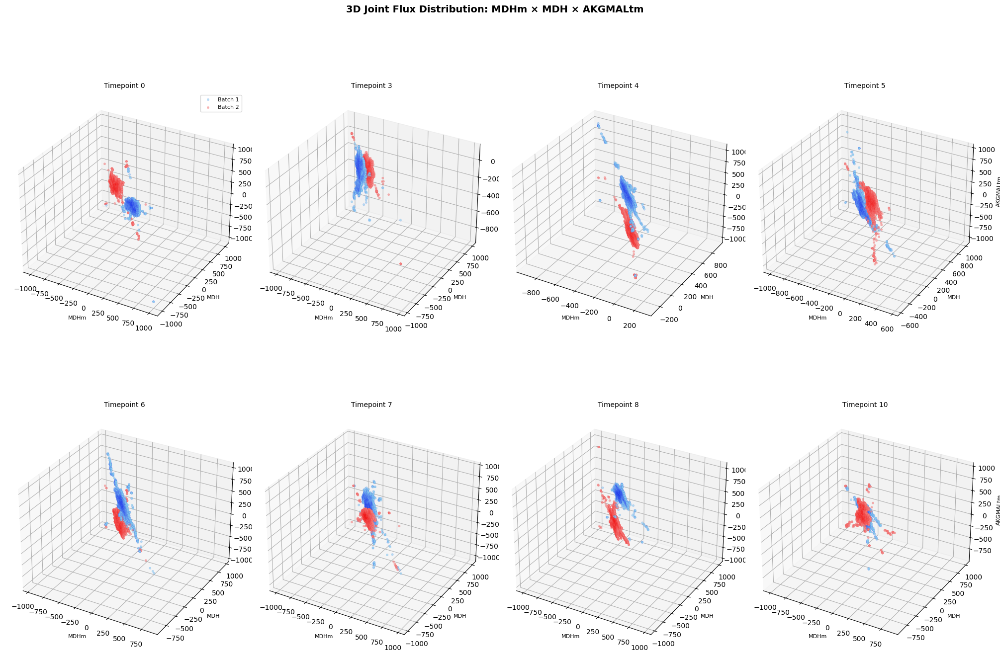

  📈 Creating 2D projection plots...
  💾 Saved projections plot: 3d_joint_flux_MDHm_x_MDH_x_AKGMALtm_projections.png


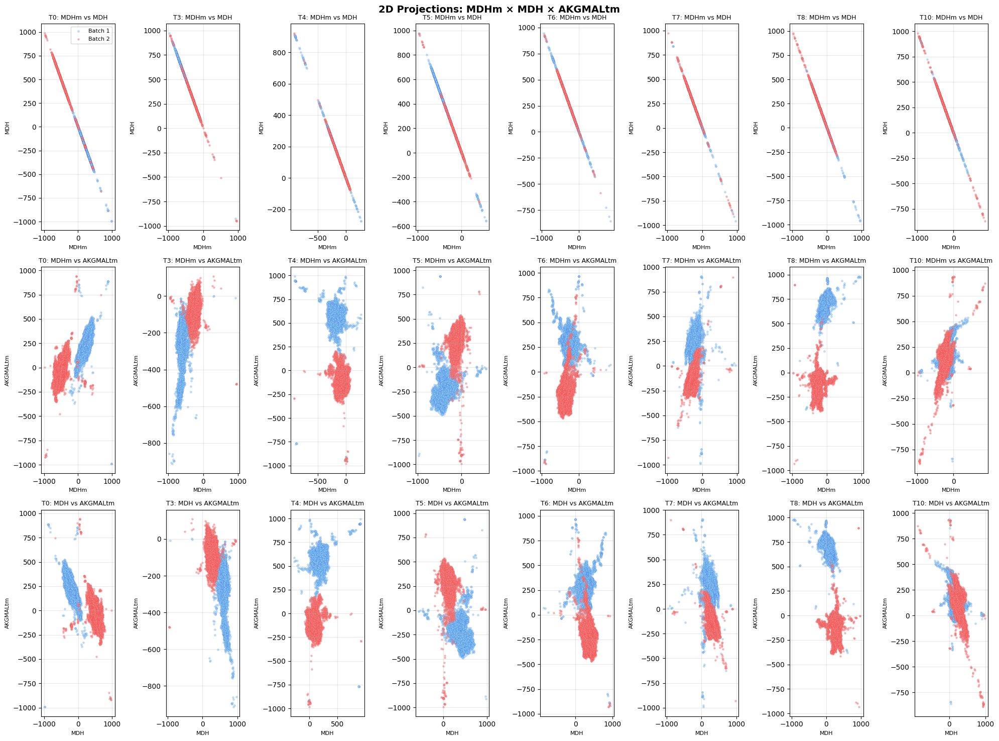


📊 ANALYSIS COMPLETE
Reaction triplet: MDHm × MDH × AKGMALtm
Common timepoints analyzed: [0, 3, 4, 5, 6, 7, 8, 10]
Output directory: 3d_flux_analysis/
Analysis completed for ('MDHm', 'MDH', 'AKGMALtm')
Timepoints analyzed: [0, 3, 4, 5, 6, 7, 8, 10]


In [21]:

# Example usage:

# Define reaction triplet to analyze
# reaction_triplet = ('AKGMALtm', 'MDHm', 'ASPTAm')  # Complete shuttle system
reaction_triplet = ('MDHm', 'MDH', 'AKGMALtm')

# Load your model
# import cobra
# model = cobra.io.read_sbml_model("your_model.xml")

results = plot_3d_joint_flux_distribution(
    batch1_data=top_batch1_samples,
    batch2_data=bottom_batch1_samples,
    reaction_triplet=reaction_triplet,
    model=model,
    output_directory="3d_flux_analysis/",
    output_prefix="3d_joint_flux",
    save_plots=True,
    plot_type="both"  # Creates both 3D and 2D projections
)

# Access results
if results:
    print(f"Analysis completed for {results['reaction_triplet']}")
    print(f"Timepoints analyzed: {results['common_timepoints']}")

In [22]:

# Optional plotly import for interactive 3D
try:
    import plotly.graph_objects as go
    import plotly.express as px
    from plotly.subplots import make_subplots
    PLOTLY_AVAILABLE = True
except ImportError:
    PLOTLY_AVAILABLE = False
    print("📌 Plotly not available. Install with: pip install plotly")
    print("   Interactive 3D rotation will use matplotlib (limited interactivity)")

def plot_3d_joint_flux_distribution(
    batch1_data: List[str],
    batch2_data: List[str], 
    reaction_triplet: Tuple[str, str, str],
    model,
    timepoints: Optional[List[int]] = None,  # NEW: Specify which timepoints to plot
    output_directory: str = ".",
    output_prefix: str = "3d_joint_flux_distribution",
    save_plots: bool = True,
    figsize: Tuple[int, int] = (20, 15),
    data_directory: str = ".",
    plot_type: str = "both",  # "3d", "projections", "both", "interactive"
    interactive_3d: bool = True  # NEW: Use plotly for interactive 3D rotation
) -> Dict:
    """
    Plot 3D joint flux distributions with interactive rotation capability.
    
    Parameters:
    -----------
    batch1_data : List[str]
        List of pickle file names for batch 1
    batch2_data : List[str]
        List of pickle file names for batch 2
    reaction_triplet : Tuple[str, str, str]
        Three reaction IDs to analyze
    model : cobra.Model
        Genome-scale metabolic model
    timepoints : Optional[List[int]]
        Specific timepoints to analyze. If None, uses all available timepoints
    interactive_3d : bool
        Use plotly for interactive 3D rotation (requires plotly installation)
    plot_type : str
        "3d", "projections", "both", or "interactive"
    
    Returns:
    --------
    Dict containing analysis results
    """
    
    def sanitize_filename(name: str) -> str:
        """Clean a string to make it safe for use in filenames."""
        invalid_chars = ['/', '\\', ':', '*', '?', '"', '<', '>', '|', ' ', '(', ')', '[', ']']
        clean_name = name
        for char in invalid_chars:
            clean_name = clean_name.replace(char, '_')
        while '__' in clean_name:
            clean_name = clean_name.replace('__', '_')
        return clean_name.strip('_')
    
    def extract_timepoint(filename: str) -> Optional[int]:
        """Extract timepoint number from filename."""
        match = re.search(r'timepoint_(\d+)', filename)
        return int(match.group(1)) if match else None
    
    def load_batch_timepoint_data(file_list, batch_name):
        """Load and organize batch data by timepoints."""
        timepoint_data = {}
        
        print(f"📁 Loading {batch_name} data...")
        for filename in file_list:
            tp = extract_timepoint(filename)
            if tp is None:
                print(f"⚠️  Could not extract timepoint from {filename}")
                continue
                
            filepath = Path(data_directory) / filename
            
            try:
                with open(filepath, 'rb') as f:
                    data = pickle.load(f)
                
                data_array = np.array(data)
                finite_mask = np.all(np.isfinite(data_array), axis=1)
                clean_data = data_array[finite_mask]
                
                if len(clean_data) < 50:
                    print(f"⚠️  {batch_name} {filename}: only {len(clean_data)} valid samples")
                    continue
                
                timepoint_data[tp] = clean_data
                print(f"✅ {batch_name} t{tp}: {clean_data.shape[0]} samples")
                
            except Exception as e:
                print(f"❌ Error loading {batch_name} {filename}: {e}")
        
        return timepoint_data
    
    print(f"🔬 3D INTERACTIVE JOINT FLUX DISTRIBUTION ANALYSIS")
    print(f"🔬 " + "="*55)
    reaction1, reaction2, reaction3 = reaction_triplet
    print(f"📊 Analyzing triplet: {reaction1} × {reaction2} × {reaction3}")
    print(f"📁 Batch 1 files: {len(batch1_data)}")
    print(f"📁 Batch 2 files: {len(batch2_data)}")
    
    # Get reaction indices from model
    all_reaction_ids = [rxn.id for rxn in model.reactions]
    reaction_id_to_index = {rxn_id: idx for idx, rxn_id in enumerate(all_reaction_ids)}
    
    # Validate all reactions exist in model
    missing_reactions = []
    for rxn_id in reaction_triplet:
        if rxn_id not in reaction_id_to_index:
            missing_reactions.append(rxn_id)
    
    if missing_reactions:
        print(f"❌ Missing reactions in model: {set(missing_reactions)}")
        return None
    
    print(f"✅ All reactions found in model")
    
    # Get reaction indices
    reaction1_idx = reaction_id_to_index[reaction1]
    reaction2_idx = reaction_id_to_index[reaction2]
    reaction3_idx = reaction_id_to_index[reaction3]
    
    # Load data for both batches
    print(f"\n📂 LOADING BATCH DATA")
    print("=" * 25)
    batch1_timepoint_data = load_batch_timepoint_data(batch1_data, "Batch1")
    batch2_timepoint_data = load_batch_timepoint_data(batch2_data, "Batch2")
    
    # Find common timepoints
    available_timepoints = sorted(set(batch1_timepoint_data.keys()) & set(batch2_timepoint_data.keys()))
    
    # Filter timepoints if specified
    if timepoints is not None:
        common_timepoints = [tp for tp in timepoints if tp in available_timepoints]
        missing_timepoints = set(timepoints) - set(available_timepoints)
        if missing_timepoints:
            print(f"⚠️  Requested timepoints not available: {missing_timepoints}")
        if not common_timepoints:
            print("❌ None of the requested timepoints are available")
            return None
    else:
        common_timepoints = available_timepoints
    
    print(f"\n📈 Available timepoints: {available_timepoints}")
    print(f"📈 Analyzing timepoints: {common_timepoints}")
    
    if len(common_timepoints) == 0:
        print("❌ No valid timepoints found")
        return None
    
    # Create output directory
    os.makedirs(output_directory, exist_ok=True)
    
    # Initialize results
    results = {
        'common_timepoints': common_timepoints,
        'reaction_triplet': reaction_triplet,
        'batch1_data': {},
        'batch2_data': {}
    }
    
    print(f"\n🧬 CREATING 3D VISUALIZATIONS")
    print("=" * 30)
    
    # Interactive 3D plots with Plotly
    if (plot_type in ["3d", "both", "interactive"]) and interactive_3d and PLOTLY_AVAILABLE:
        print(f"  🔄 Creating interactive 3D plots with Plotly...")
        
        # Calculate subplot dimensions
        n_timepoints = len(common_timepoints)
        n_cols = min(3, n_timepoints)  # Max 3 columns for better visibility
        n_rows = (n_timepoints + n_cols - 1) // n_cols
        
        # Create subplot titles
        subplot_titles = [f"Timepoint {tp}" for tp in common_timepoints]
        
        # Create subplots
        fig = make_subplots(
            rows=n_rows, cols=n_cols,
            specs=[[{"type": "scatter3d"} for _ in range(n_cols)] for _ in range(n_rows)],
            subplot_titles=subplot_titles,
            horizontal_spacing=0.05,
            vertical_spacing=0.1
        )
        
        for idx, tp in enumerate(common_timepoints):
            row = (idx // n_cols) + 1
            col = (idx % n_cols) + 1
            
            # Get flux data
            batch1_flux1 = batch1_timepoint_data[tp][:, reaction1_idx]
            batch1_flux2 = batch1_timepoint_data[tp][:, reaction2_idx]
            batch1_flux3 = batch1_timepoint_data[tp][:, reaction3_idx]
            
            batch2_flux1 = batch2_timepoint_data[tp][:, reaction1_idx]
            batch2_flux2 = batch2_timepoint_data[tp][:, reaction2_idx]
            batch2_flux3 = batch2_timepoint_data[tp][:, reaction3_idx]
            
            # Store data
            results['batch1_data'][f't{tp}'] = {
                'flux1': batch1_flux1, 'flux2': batch1_flux2, 'flux3': batch1_flux3
            }
            results['batch2_data'][f't{tp}'] = {
                'flux1': batch2_flux1, 'flux2': batch2_flux2, 'flux3': batch2_flux3
            }
            
            # Auto-scaling function
            def get_scaling(flux_data, reaction_name):
                flux_magnitude = np.mean(np.abs(flux_data[flux_data != 0])) if np.any(flux_data != 0) else 1
                if flux_magnitude < 1e-6:
                    scale = 10 ** (-np.floor(np.log10(flux_magnitude)))
                    return flux_data * scale, f'{reaction_name} (×{scale:.0e})'
                else:
                    return flux_data, f'{reaction_name}'
            
            # Scale data
            batch1_flux1_scaled, xlabel = get_scaling(batch1_flux1, reaction1)
            batch1_flux2_scaled, ylabel = get_scaling(batch1_flux2, reaction2)
            batch1_flux3_scaled, zlabel = get_scaling(batch1_flux3, reaction3)
            
            batch2_flux1_scaled, _ = get_scaling(batch2_flux1, reaction1)
            batch2_flux2_scaled, _ = get_scaling(batch2_flux2, reaction2)
            batch2_flux3_scaled, _ = get_scaling(batch2_flux3, reaction3)
            
            # Add Batch 1 trace
            fig.add_trace(
                go.Scatter3d(
                    x=batch1_flux1_scaled,
                    y=batch1_flux2_scaled,
                    z=batch1_flux3_scaled,
                    mode='markers',
                    marker=dict(
                        size=3,
                        color='blue',
                        opacity=0.6
                    ),
                    name=f'Batch 1' if idx == 0 else None,
                    showlegend=(idx == 0),
                    legendgroup='batch1'
                ),
                row=row, col=col
            )
            
            # Add Batch 2 trace
            fig.add_trace(
                go.Scatter3d(
                    x=batch2_flux1_scaled,
                    y=batch2_flux2_scaled,
                    z=batch2_flux3_scaled,
                    mode='markers',
                    marker=dict(
                        size=3,
                        color='red',
                        opacity=0.6
                    ),
                    name=f'Batch 2' if idx == 0 else None,
                    showlegend=(idx == 0),
                    legendgroup='batch2'
                ),
                row=row, col=col
            )
            
            # Update axes labels (only works for single subplot in plotly)
            if len(common_timepoints) == 1:
                fig.update_layout(
                    scene=dict(
                        xaxis_title=xlabel,
                        yaxis_title=ylabel,
                        zaxis_title=zlabel,
                    )
                )
        
        # Update layout
        fig.update_layout(
            title=f'Interactive 3D Joint Flux Distribution: {reaction1} × {reaction2} × {reaction3}',
            height=400 * n_rows,
            showlegend=True
        )
        
        # Show interactive plot
        fig.show()
        
        # Save as HTML for interactivity
        if save_plots:
            html_filename = os.path.join(output_directory, 
                                       f"{output_prefix}_{sanitize_filename(reaction1)}_x_{sanitize_filename(reaction2)}_x_{sanitize_filename(reaction3)}_interactive.html")
            fig.write_html(html_filename)
            print(f"  💾 Saved interactive plot: {os.path.basename(html_filename)}")
            print(f"  🔄 Open the HTML file in a browser for full 3D rotation capability")
    
    # Static matplotlib 3D plots (with limited rotation in interactive backends)
    elif plot_type in ["3d", "both"]:
        print(f"  📊 Creating 3D scatter plots with matplotlib...")
        print(f"  💡 For interactive rotation, install plotly and set interactive_3d=True")
        
        # Calculate grid dimensions
        n_timepoints = len(common_timepoints)
        n_cols = min(4, n_timepoints)
        n_rows = (n_timepoints + n_cols - 1) // n_cols
        
        fig = plt.figure(figsize=(figsize[0], figsize[1]))
        
        for idx, tp in enumerate(common_timepoints):
            ax = fig.add_subplot(n_rows, n_cols, idx+1, projection='3d')
            
            # Get and process data (same as before)
            batch1_flux1 = batch1_timepoint_data[tp][:, reaction1_idx]
            batch1_flux2 = batch1_timepoint_data[tp][:, reaction2_idx]
            batch1_flux3 = batch1_timepoint_data[tp][:, reaction3_idx]
            
            batch2_flux1 = batch2_timepoint_data[tp][:, reaction1_idx]
            batch2_flux2 = batch2_timepoint_data[tp][:, reaction2_idx]
            batch2_flux3 = batch2_timepoint_data[tp][:, reaction3_idx]
            
            # Store data
            results['batch1_data'][f't{tp}'] = {
                'flux1': batch1_flux1, 'flux2': batch1_flux2, 'flux3': batch1_flux3
            }
            results['batch2_data'][f't{tp}'] = {
                'flux1': batch2_flux1, 'flux2': batch2_flux2, 'flux3': batch2_flux3
            }
            
            # Auto-scaling and plotting (same as original)
            def get_scaling(flux_data, reaction_name):
                flux_magnitude = np.mean(np.abs(flux_data[flux_data != 0])) if np.any(flux_data != 0) else 1
                if flux_magnitude < 1e-6:
                    scale = 10 ** (-np.floor(np.log10(flux_magnitude)))
                    return flux_data * scale, f'{reaction_name} (×{scale:.0e})'
                else:
                    return flux_data, f'{reaction_name}'
            
            batch1_flux1_display, xlabel = get_scaling(batch1_flux1, reaction1)
            batch1_flux2_display, ylabel = get_scaling(batch1_flux2, reaction2)
            batch1_flux3_display, zlabel = get_scaling(batch1_flux3, reaction3)
            
            batch2_flux1_display, _ = get_scaling(batch2_flux1, reaction1)
            batch2_flux2_display, _ = get_scaling(batch2_flux2, reaction2)
            batch2_flux3_display, _ = get_scaling(batch2_flux3, reaction3)
            
            # Create 3D scatter plot
            ax.scatter(batch1_flux1_display, batch1_flux2_display, batch1_flux3_display,
                      alpha=0.6, s=10, color='skyblue', label='Batch 1', 
                      edgecolors='blue', linewidth=0.1)
            ax.scatter(batch2_flux1_display, batch2_flux2_display, batch2_flux3_display,
                      alpha=0.6, s=10, color='lightcoral', label='Batch 2', 
                      edgecolors='red', linewidth=0.1)
            
            # Formatting
            ax.set_xlabel(xlabel, fontsize=8)
            ax.set_ylabel(ylabel, fontsize=8)
            ax.set_zlabel(zlabel, fontsize=8)
            ax.set_title(f'Timepoint {tp}', fontsize=10)
            if idx == 0:
                ax.legend(fontsize=8)
        
        plt.suptitle(f'3D Joint Flux Distribution: {reaction1} × {reaction2} × {reaction3}', 
                    fontsize=14, fontweight='bold')
        plt.tight_layout()
        
        # Save static 3D plot
        if save_plots:
            filename_3d = os.path.join(output_directory, 
                                     f"{output_prefix}_{sanitize_filename(reaction1)}_x_{sanitize_filename(reaction2)}_x_{sanitize_filename(reaction3)}_3d.png")
            plt.savefig(filename_3d, dpi=300, bbox_inches='tight')
            print(f"  💾 Saved 3D plot: {os.path.basename(filename_3d)}")
        
        plt.show()
        plt.close()
    
    # [Rest of the 2D projection code remains the same, but filtered by timepoints...]
    
    print(f"\n📊 ANALYSIS COMPLETE")
    print(f"=" * 25)
    print(f"Reaction triplet: {reaction1} × {reaction2} × {reaction3}")
    print(f"Analyzed timepoints: {common_timepoints}")
    print(f"Output directory: {output_directory}")
    
    return results


In [23]:
reaction_triplet = ('MDHm', 'MDH', 'AKGMALtm')

# Load your model
# import cobra
# model = cobra.io.read_sbml_model("your_model.xml")

results = plot_3d_joint_flux_distribution(
    batch1_data=top_batch1_samples,
    batch2_data=bottom_batch1_samples,
    reaction_triplet=reaction_triplet,
    model=model,
    output_directory="3d_flux_analysis/",
    output_prefix="3d_joint_flux",
    save_plots=True,
    plot_type="both"  # Creates both 3D and 2D projections
)

# Access results
if results:
    print(f"Analysis completed for {results['reaction_triplet']}")
    print(f"Timepoints analyzed: {results['common_timepoints']}")

🔬 3D INTERACTIVE JOINT FLUX DISTRIBUTION ANALYSIS
🔬 =======================================================
📊 Analyzing triplet: MDHm × MDH × AKGMALtm
📁 Batch 1 files: 11
📁 Batch 2 files: 9
✅ All reactions found in model

📂 LOADING BATCH DATA
📁 Loading Batch1 data...
✅ Batch1 t0: 5000 samples
✅ Batch1 t1: 5000 samples
✅ Batch1 t2: 5000 samples
✅ Batch1 t3: 5000 samples
✅ Batch1 t4: 5000 samples
✅ Batch1 t5: 5000 samples
✅ Batch1 t6: 5000 samples
✅ Batch1 t7: 5000 samples
✅ Batch1 t8: 5000 samples
✅ Batch1 t9: 5000 samples
✅ Batch1 t10: 5000 samples
📁 Loading Batch2 data...
✅ Batch2 t0: 5000 samples
✅ Batch2 t3: 5000 samples
✅ Batch2 t4: 5000 samples
✅ Batch2 t5: 5000 samples
✅ Batch2 t6: 5000 samples
✅ Batch2 t7: 5000 samples
✅ Batch2 t8: 5000 samples
❌ Error loading Batch2 bottom_batch1_sampled_fluxes_timepoint_9.pkl: [Errno 2] No such file or directory: 'bottom_batch1_sampled_fluxes_timepoint_9.pkl'
✅ Batch2 t10: 5000 samples

📈 Available timepoints: [0, 3, 4, 5, 6, 7, 8, 10]
📈 Analy

  💾 Saved interactive plot: 3d_joint_flux_MDHm_x_MDH_x_AKGMALtm_interactive.html
  🔄 Open the HTML file in a browser for full 3D rotation capability

📊 ANALYSIS COMPLETE
Reaction triplet: MDHm × MDH × AKGMALtm
Analyzed timepoints: [0, 3, 4, 5, 6, 7, 8, 10]
Output directory: 3d_flux_analysis/
Analysis completed for ('MDHm', 'MDH', 'AKGMALtm')
Timepoints analyzed: [0, 3, 4, 5, 6, 7, 8, 10]


In [ ]:
reaction_triplet = ('AKGMALtm', 'MDHm', 'ASPTAm')

# Load your model
# import cobra
# model = cobra.io.read_sbml_model("your_model.xml")

results = plot_3d_joint_flux_distribution(
    batch1_data=top_batch1_samples,
    batch2_data=bottom_batch1_samples,
    reaction_triplet=reaction_triplet,
    model=model,
    output_directory="3d_flux_analysis/",
    output_prefix="3d_joint_flux",
    save_plots=True,
    plot_type="both"  # Creates both 3D and 2D projections
)

# Access results
if results:
    print(f"Analysis completed for {results['reaction_triplet']}")
    print(f"Timepoints analyzed: {results['common_timepoints']}")

🔬 3D INTERACTIVE JOINT FLUX DISTRIBUTION ANALYSIS
🔬 =======================================================
📊 Analyzing triplet: AKGMALtm × MDHm × ASPTAm
📁 Batch 1 files: 11
📁 Batch 2 files: 9
✅ All reactions found in model

📂 LOADING BATCH DATA
📁 Loading Batch1 data...
✅ Batch1 t0: 5000 samples
✅ Batch1 t1: 5000 samples
✅ Batch1 t2: 5000 samples
✅ Batch1 t3: 5000 samples
✅ Batch1 t4: 5000 samples
✅ Batch1 t5: 5000 samples
✅ Batch1 t6: 5000 samples
✅ Batch1 t7: 5000 samples
✅ Batch1 t8: 5000 samples


### high quality plot generation

for rxn 'HEX1': time points 0, 5, 8
for rxn 'FBA': time points 0, 5, 8
for rxn 'PGK': time points 0, 6, 8
for rxn 'LDH_D': time points 0, 6, 8   (should i make a seperate graph for lactate dehydrogenase?)

for rxn 'PCm': time points 0, 6, 10
for rxn 'CSm': time points 3, 5, 7
for rxn 'MDHm': time points 

In [24]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from typing import List, Optional, Dict, Tuple
import warnings
import os
import re
from scipy import stats
from matplotlib.patches import Rectangle
import matplotlib.patches as mpatches
from matplotlib.patches import FancyBboxPatch

def plot_publication_quality_distributions(
    batch1_data: List[str],
    batch2_data: List[str],
    reaction_timepoints: Dict[str, List[int]],
    model,
    output_directory: str = ".",
    output_prefix: str = "publication_distributions",
    data_directory: str = ".",
    save_plots: bool = True,
    figsize: Tuple[int, int] = (18, 12),
    dpi: int = 300,
    x_limits: Optional[Tuple[float, float]] = None,
    debug: bool = False
) -> Dict:
    """
    Create high-quality publication plots with raw flux values and counts.
    All scaling removed, explicit range control, and variable naming conflicts fixed.
    """
    
    # Reaction information for artistic labeling
    reaction_info = {
        'HEX1': {'full_name': 'Hexokinase', 'pathway': 'Glycolysis'},
        'FBA': {'full_name': 'Fructose-bisphosphate aldolase', 'pathway': 'Glycolysis'},
        'PGK': {'full_name': 'Phosphoglycerate kinase', 'pathway': 'Glycolysis'},
        'LDH_D': {'full_name': 'Lactate dehydrogenase', 'pathway': 'Lactate metabolism'},
        'PCm': {'full_name': 'Pyruvate carboxylase', 'pathway': 'Anaplerotic reactions'},
        'CSm': {'full_name': 'Citrate synthase', 'pathway': 'TCA cycle'},
        'MDHm': {'full_name': 'Malate dehydrogenase', 'pathway': 'TCA cycle'},
        'SUCD1m': {'full_name': 'Succinate dehydrogenase', 'pathway': 'TCA cycle'},
        'EX_o2(e)': {'full_name': 'Oxygen exchange', 'pathway': 'Respiration'}
    }
    
    # Phase information
    phase_info = {
        0: {'name': 'Early Exponential', 'color': '#E8F4F8', 'text_color': '#2C3E50'},
        1: {'name': 'Late Exponential', 'color': '#FFF2E8', 'text_color': '#8B4513'}, 
        2: {'name': 'Stationary', 'color': '#F0E8F8', 'text_color': '#4A148C'}
    }
    
    def sanitize_filename(name: str) -> str:
        invalid_chars = ['/', '\\', ':', '*', '?', '"', '<', '>', '|', ' ', '(', ')', '[', ']']
        clean_name = name
        for char in invalid_chars:
            clean_name = clean_name.replace(char, '_')
        return clean_name.strip('_')
    
    def extract_timepoint(filename: str) -> Optional[int]:
        match = re.search(r'timepoint_(\d+)', filename)
        return int(match.group(1)) if match else None
    
    def load_batch_data(file_list, batch_name):
        timepoint_data = {}
        print(f"📁 Loading {batch_name} data...")
        
        for filename in file_list:
            tp = extract_timepoint(filename)
            if tp is None:
                continue
                
            filepath = Path(data_directory) / filename
            try:
                with open(filepath, 'rb') as f:
                    data = pickle.load(f)
                
                data_array = np.array(data)
                finite_mask = np.all(np.isfinite(data_array), axis=1)
                clean_data = data_array[finite_mask]
                
                if len(clean_data) >= 50:
                    timepoint_data[tp] = clean_data
                    print(f"  ✅ t{tp}: {clean_data.shape[0]} samples")
                else:
                    print(f"  ⚠️  t{tp}: only {len(clean_data)} samples - skipped")
                    
            except Exception as e:
                print(f"  ❌ Error loading {filename}: {e}")
        
        return timepoint_data
    
    def calculate_statistics(data1, data2):
        try:
            statistic, p_value = stats.mannwhitneyu(data1, data2, alternative='two-sided')
            n1, n2 = len(data1), len(data2)
            U1 = statistic
            effect_size = 1 - (2 * U1) / (n1 * n2)
            
            if abs(effect_size) < 0.3:
                effect_magnitude = "Small"
            elif abs(effect_size) < 0.5:
                effect_magnitude = "Medium"
            else:
                effect_magnitude = "Large"
            
            return {
                'p_value': p_value,
                'effect_size': effect_size,
                'effect_magnitude': effect_magnitude,
                'n1': n1,
                'n2': n2
            }
        except Exception as e:
            print(f"Statistical calculation error: {e}")
            return None
    
    def format_p_value(p_val):
        if p_val < 0.001:
            return "p < 0.001***"
        elif p_val < 0.01:
            return f"p = {p_val:.3f}**"
        elif p_val < 0.05:
            return f"p = {p_val:.3f}*"
        else:
            return f"p = {p_val:.3f}"
    
    # Configure matplotlib for publication quality with Arial font
    plt.rcParams.update({
        'font.family': 'sans-serif',
        'font.sans-serif': ['Arial', 'Liberation Sans', 'DejaVu Sans'],
        'font.size': 11,
        'axes.titlesize': 12,
        'axes.labelsize': 11,
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'legend.fontsize': 11,
        'figure.titlesize': 16,
        'axes.linewidth': 1.2,
        'grid.alpha': 0.3,
        'axes.spines.top': False,
        'axes.spines.right': False,
    })
    
    print(f"🎨 HIGH-QUALITY PUBLICATION PLOTS (NO SCALING)")
    print(f"🎨 " + "="*50)
    
    # Get reaction indices and validate
    all_reaction_ids = [rxn.id for rxn in model.reactions]
    reaction_id_to_index = {rxn_id: idx for idx, rxn_id in enumerate(all_reaction_ids)}
    
    missing_reactions = [rxn for rxn in reaction_timepoints.keys() if rxn not in reaction_id_to_index]
    if missing_reactions:
        print(f"❌ Missing reactions: {missing_reactions}")
        return None
    
    # Load data
    batch1_timepoint_data = load_batch_data(batch1_data, "Batch1")
    batch2_timepoint_data = load_batch_data(batch2_data, "Batch2")
    
    os.makedirs(output_directory, exist_ok=True)
    
    # Calculate subplot dimensions
    n_reactions = len(reaction_timepoints)
    n_phases = 3  # Always 3 phases
    
    # Create figure with custom spacing for artistic layout
    fig = plt.figure(figsize=figsize)
    
    # Create custom gridspec for better control over spacing
    gs = fig.add_gridspec(n_reactions, n_phases, 
                         left=0.15, right=0.95, top=0.85, bottom=0.1,
                         hspace=0.3, wspace=0.2)
    
    # Professional color scheme
    colors = {
        'batch1': '#1f77b4',      # Professional blue
        'batch2': '#d62728',      # Professional red
        'batch1_alpha': 0.7,
        'batch2_alpha': 0.7
    }
    
    results = {
        'reaction_timepoints': reaction_timepoints,
        'statistical_results': {}
    }
    
    print(f"\n🧬 CREATING HIGH-QUALITY PLOTS")
    print("=" * 35)
    
    # Add phase headers with artistic styling
    phase_names = ['Early Exponential', 'Late Exponential', 'Stationary']
    for col_idx, phase_name in enumerate(phase_names):
        # Add phase header with background
        fig.text(0.15 + (col_idx + 0.5) * (0.8 / n_phases), 0.92, phase_name, 
                ha='center', va='center', fontsize=14, fontweight='bold',
                color=phase_info[col_idx]['text_color'],
                bbox=dict(boxstyle="round,pad=0.3", 
                         facecolor=phase_info[col_idx]['color'], 
                         edgecolor='none', alpha=0.8))
    
    # Process each reaction
    row_idx = 0
    for reaction_id, timepoints_list in reaction_timepoints.items():
        print(f"\n  🔬 Processing {reaction_id}...")
        
        reaction_idx = reaction_id_to_index[reaction_id]
        results['statistical_results'][reaction_id] = {}
        
        # Add artistic reaction name label on the left
        reaction_full = reaction_info.get(reaction_id, {}).get('full_name', reaction_id)
        pathway = reaction_info.get(reaction_id, {}).get('pathway', '')
        
        # Create artistic reaction label
        y_position = 0.85 - (row_idx + 0.5) * (0.75 / n_reactions)
        
        # Main reaction name (large)
        fig.text(0.02, y_position + 0.02, reaction_id, 
                ha='left', va='center', fontsize=16, fontweight='bold',
                color='#2C3E50')
        
        # Full enzyme name (smaller, italics)
        # fig.text(0.02, y_position - 0.02, reaction_full, 
        #         ha='left', va='center', fontsize=10, style='italic',
        #         color='#7F8C8D')
        
        # Pathway information (smallest)
        # if pathway:
        #     fig.text(0.02, y_position - 0.05, f"({pathway})", 
        #             ha='left', va='center', fontsize=9,
        #             color='#95A5A6')
        
        # Process each timepoint/phase
        for col_idx, timepoint in enumerate(timepoints_list):
            if timepoint not in batch1_timepoint_data or timepoint not in batch2_timepoint_data:
                continue
            
            # Create subplot
            ax = fig.add_subplot(gs[row_idx, col_idx])
            
            # Add subtle phase background
            phase_bg = Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                               facecolor=phase_info[col_idx]['color'], 
                               alpha=0.3, zorder=0)
            ax.add_patch(phase_bg)
            
            # Get flux data
            batch1_flux = batch1_timepoint_data[timepoint][:, reaction_idx]
            batch2_flux = batch2_timepoint_data[timepoint][:, reaction_idx]
            
            # Debug information
            if debug:
                print(f"    🔍 DEBUG {reaction_id} t{timepoint}:")
                print(f"      Batch1 range: [{np.min(batch1_flux):.6e}, {np.max(batch1_flux):.6e}]")
                print(f"      Batch2 range: [{np.min(batch2_flux):.6e}, {np.max(batch2_flux):.6e}]")
                print(f"      Samples: {len(batch1_flux)}, {len(batch2_flux)}")
            
            # Calculate statistics
            stats_result = calculate_statistics(batch1_flux, batch2_flux)
            if stats_result:
                results['statistical_results'][reaction_id][f't{timepoint}'] = stats_result
            
            # NO SCALING - use raw flux values
            batch1_flux_display = batch1_flux
            batch2_flux_display = batch2_flux
            xlabel = 'Flux Value'
            
            # Determine histogram range with explicit control
            combined_data = np.concatenate([batch1_flux_display, batch2_flux_display])
            
            if x_limits is not None:
                data_min, data_max = x_limits
            else:
                data_min, data_max = np.min(combined_data), np.max(combined_data)
                # Add small margin
                margin = (data_max - data_min) * 0.05 if data_max != data_min else 0.1
                data_min, data_max = data_min - margin, data_max + margin
            
            # Create explicit bins
            bins = np.linspace(data_min, data_max, 40)
            
            # Create histograms with raw counts and explicit range
            ax.hist(batch1_flux_display, bins=bins, alpha=colors['batch1_alpha'], 
                   color=colors['batch1'], density=False,  # Raw counts, no density
                   edgecolor='white', linewidth=0.5, 
                   label='High-yielding' if row_idx == 0 and col_idx == 0 else "")
            ax.hist(batch2_flux_display, bins=bins, alpha=colors['batch2_alpha'], 
                   color=colors['batch2'], density=False,  # Raw counts, no density
                   edgecolor='white', linewidth=0.5, 
                   label='Low-yielding' if row_idx == 0 and col_idx == 0 else "")
            
            # Set explicit x-axis limits
            ax.set_xlim(data_min, data_max)
            
            # Add median lines (using raw values)
            median1 = np.median(batch1_flux_display)
            median2 = np.median(batch2_flux_display)
            ax.axvline(median1, color=colors['batch1'], linestyle='--', linewidth=2.5, alpha=0.9)
            ax.axvline(median2, color=colors['batch2'], linestyle='--', linewidth=2.5, alpha=0.9)
            
            # Statistical annotation
            if stats_result:
                p_text = format_p_value(stats_result['p_value'])
                effect_text = f"r = {stats_result['effect_size']:.3f}"
                
                # Create artistic statistics box
                stats_box = f"{p_text}\n{effect_text}"
                ax.text(0.98, 0.95, stats_box, transform=ax.transAxes, 
                       fontsize=13, va='top', ha='right',
                       bbox=dict(boxstyle="round,pad=0.4", 
                               facecolor='white', edgecolor='#BDC3C7', 
                               alpha=0.9, linewidth=1))
            
            # Clean formatting
            ax.set_xlabel(xlabel, fontsize=10)
            ax.set_ylabel('Count', fontsize=10)  # Raw counts
            ax.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
            ax.set_axisbelow(True)
            
            # Use scientific notation for x-axis if values are very small or large
            ax.ticklabel_format(style='scientific', axis='x', scilimits=(-3, 3))
            
            # Remove top and right spines
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.spines['left'].set_color('#7F8C8D')
            ax.spines['bottom'].set_color('#7F8C8D')
        
        row_idx += 1
    
    # Add elegant overall title
    fig.suptitle('Mitochondrial Flux Distributions Across Growth Phases', 
                fontsize=18, fontweight='bold', color='#2C3E50', y=0.97)
    
    # Add elegant legend at the bottom
    legend_elements = [
        mpatches.Patch(color=colors['batch1'], alpha=colors['batch1_alpha'], label='High-yielding batch'),
        mpatches.Patch(color=colors['batch2'], alpha=colors['batch2_alpha'], label='Low-yielding batch'),
        plt.Line2D([0], [0], color=colors['batch1'], linestyle='--', linewidth=2.5, alpha=0.9, label='Median (high-yielding)'),
        plt.Line2D([0], [0], color=colors['batch2'], linestyle='--', linewidth=2.5, alpha=0.9, label='Median (low-yielding)')
    ]
    
    fig.legend(handles=legend_elements, loc='lower center', 
              bbox_to_anchor=(0.5, 0.02), ncol=4, frameon=False, fontsize=14)
    
    # Save in multiple high-quality formats
    if save_plots:
        base_filename = os.path.join(output_directory, f"{output_prefix}_high_quality")
        
        # PNG for general use
        plt.savefig(f"{base_filename}.png", dpi=dpi, bbox_inches='tight', 
                   facecolor='white', edgecolor='none')
        
        # PDF for publication (vector)
        plt.savefig(f"{base_filename}.pdf", dpi=dpi, bbox_inches='tight', 
                   facecolor='white', edgecolor='none')
        
        # SVG for editing
        plt.savefig(f"{base_filename}.svg", bbox_inches='tight', 
                   facecolor='white', edgecolor='none')
        
        print(f"\n💾 SAVED HIGH-QUALITY FILES:")
        print(f"  📄 PNG: {output_prefix}_high_quality.png")
        print(f"  📄 PDF: {output_prefix}_high_quality.pdf (vector - publication ready)")
        print(f"  📄 SVG: {output_prefix}_high_quality.svg (fully editable)")
    
    plt.show()
    
    # Save statistical results (FIXED - renamed variable to avoid conflict)
    if save_plots:
        stats_data = []
        for reaction_id, timepoint_stats in results['statistical_results'].items():
            for timepoint, stat_result in timepoint_stats.items():  # FIXED: renamed from 'stats'
                stats_data.append({
                    'Reaction': reaction_id,
                    'Timepoint': timepoint.replace('t', ''),
                    'P_Value': stat_result['p_value'],      # FIXED: use 'stat_result'
                    'Effect_Size': stat_result['effect_size'],
                    'Effect_Magnitude': stat_result['effect_magnitude'],
                    'N_Batch1': stat_result['n1'],
                    'N_Batch2': stat_result['n2']
                })
        
        stats_df = pd.DataFrame(stats_data)
        csv_filename = os.path.join(output_directory, f"{output_prefix}_statistics_high_quality.csv")
        stats_df.to_csv(csv_filename, index=False)
        print(f"  📊 Statistics: {os.path.basename(csv_filename)}")
    
    return results


🎨 HIGH-QUALITY PUBLICATION PLOTS (NO SCALING)
🎨 ==================================================
📁 Loading Batch1 data...
  ✅ t0: 5000 samples
  ✅ t1: 5000 samples
  ✅ t2: 5000 samples
  ✅ t3: 5000 samples
  ✅ t4: 5000 samples
  ✅ t5: 5000 samples
  ✅ t6: 5000 samples
  ✅ t7: 5000 samples
  ✅ t8: 5000 samples
  ✅ t9: 5000 samples
  ✅ t10: 5000 samples
📁 Loading Batch2 data...
  ✅ t0: 5000 samples
  ✅ t3: 5000 samples
  ✅ t4: 5000 samples
  ✅ t5: 5000 samples
  ✅ t6: 5000 samples
  ✅ t7: 5000 samples
  ✅ t8: 5000 samples
  ❌ Error loading bottom_batch1_sampled_fluxes_timepoint_9.pkl: [Errno 2] No such file or directory: 'bottom_batch1_sampled_fluxes_timepoint_9.pkl'
  ✅ t10: 5000 samples

🧬 CREATING HIGH-QUALITY PLOTS

  🔬 Processing HEX1...
    🔍 DEBUG HEX1 t0:
      Batch1 range: [9.987603e-06, 1.163009e+00]
      Batch2 range: [2.667225e-05, 1.141759e+00]
      Samples: 5000, 5000
    🔍 DEBUG HEX1 t5:
      Batch1 range: [4.058969e-06, 1.169528e-01]
      Batch2 range: [1.546160e-0

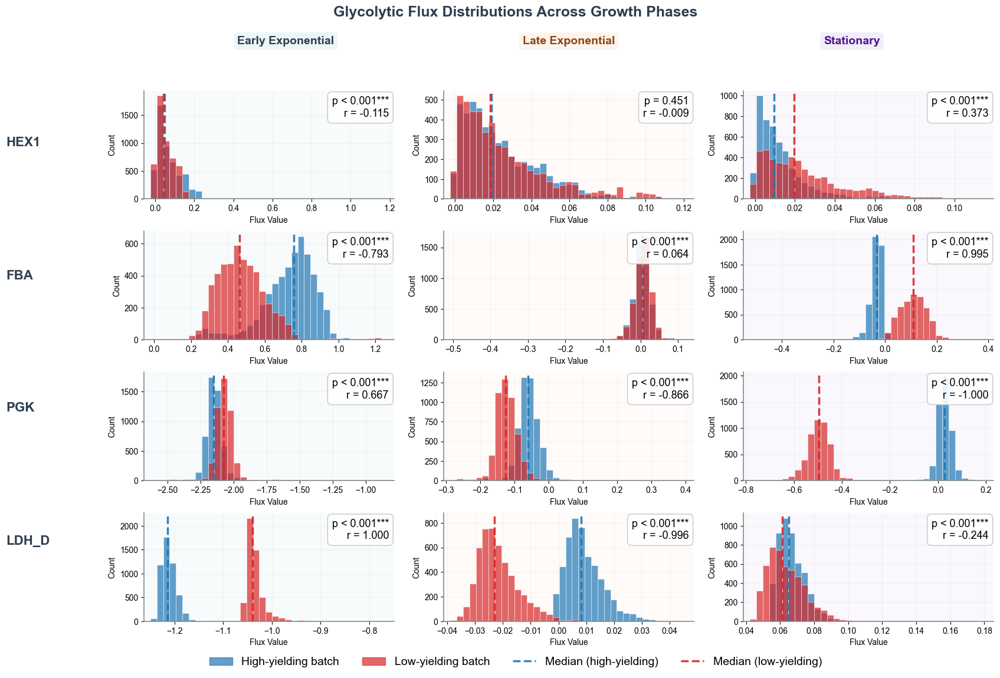

  📊 Statistics: glycolysis_high_quality_statistics_high_quality.csv


In [23]:

# Example usage:

    
# Glycolysis reactions
glycolysis_reactions = {
    'HEX1': [0, 5, 8],
    'FBA': [0, 5, 8], 
    'PGK': [0, 6, 8],
    'LDH_D': [0, 6, 8]
}

# TCA cycle reactions  
tca_reactions = {
    'PCm': [0, 5, 8],
    'CSm': [0, 5, 8],
    'MDHm': [0, 5, 8], 
    'SUCD1m': [0, 5, 8],
    'EX_o2(e)': [0, 5, 8]
}

# Create plots
results = plot_publication_quality_distributions(
    batch1_data=top_batch1_samples,
    batch2_data=bottom_batch1_samples, 
    reaction_timepoints=glycolysis_reactions,  # or tca_reactions
    model=model,
    output_directory="publication_plots/",
    output_prefix="glycolysis_high_quality",
    data_directory=".",
    dpi=400,
    figsize=(18, 12),
    debug=True  # Set to True for debugging info
)

🎨 HIGH-QUALITY PUBLICATION PLOTS (NO SCALING)
🎨 ==================================================
📁 Loading Batch1 data...
  ✅ t0: 5000 samples
  ✅ t1: 5000 samples
  ✅ t2: 5000 samples
  ✅ t3: 5000 samples
  ✅ t4: 5000 samples
  ✅ t5: 5000 samples
  ✅ t6: 5000 samples
  ✅ t7: 5000 samples
  ✅ t8: 5000 samples
  ✅ t9: 5000 samples
  ✅ t10: 5000 samples
📁 Loading Batch2 data...
  ✅ t0: 5000 samples
  ✅ t3: 5000 samples
  ✅ t4: 5000 samples
  ✅ t5: 5000 samples
  ✅ t6: 5000 samples
  ✅ t7: 5000 samples
  ✅ t8: 5000 samples
  ❌ Error loading bottom_batch1_sampled_fluxes_timepoint_9.pkl: [Errno 2] No such file or directory: 'bottom_batch1_sampled_fluxes_timepoint_9.pkl'
  ✅ t10: 5000 samples

🧬 CREATING HIGH-QUALITY PLOTS

  🔬 Processing PCm...
    🔍 DEBUG PCm t3:
      Batch1 range: [3.058238e-05, 1.224406e+00]
      Batch2 range: [3.327890e-06, 1.751635e+00]
      Samples: 5000, 5000
    🔍 DEBUG PCm t5:
      Batch1 range: [7.524473e-05, 1.267878e+00]
      Batch2 range: [3.290248e-06, 

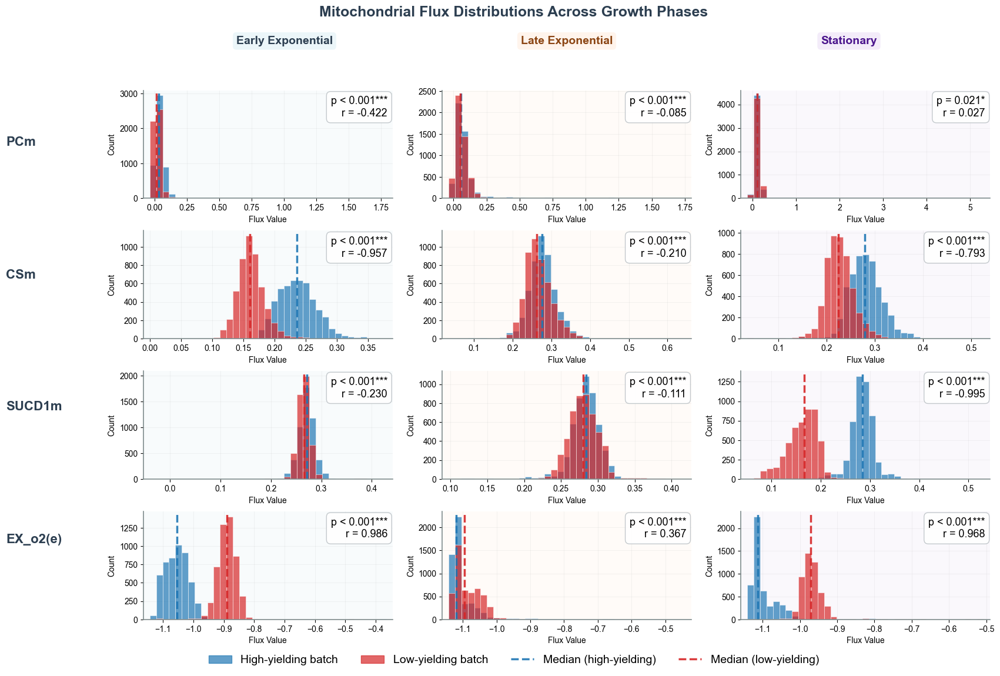

  📊 Statistics: tca_high_quality_statistics_high_quality.csv


In [27]:
# Create plots
tca_reactions = {
    'PCm': [3, 5, 8],
    'CSm': [3, 5, 7],
    # 'MDHm': [0, 5, 8], 
    'SUCD1m': [3, 5, 8],
    'EX_o2(e)': [3, 5, 7]
}
results = plot_publication_quality_distributions(
    batch1_data=top_batch1_samples,
    batch2_data=bottom_batch1_samples, 
    reaction_timepoints=tca_reactions,  # or tca_reactions
    model=model,
    output_directory="publication_plots/",
    output_prefix="tca_high_quality",
    data_directory=".",
    dpi=400,
    figsize=(18, 12),
    debug=True  # Set to True for debugging info
)